<a href="https://colab.research.google.com/github/M0hammad-Kashif/Notebooks/blob/main/Basic_Gans_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch,pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt



In [ ]:
 def show(tensor,ch=1,size=(28,28),num=16):
  #  batch size will be of 128 , so tensor shape will be 128x784

   data = tensor.detach().cpu().view(-1,ch,*size)  # 128x1x28x28
   grid = make_grid(data[:num],nrow=4).permute(1,2,0) # b/c converntion of matplotlib is (w,h,channel) but for torch is (channel,w,h), so changeing it 
                                                      # 1 x28 x 28 = 28 x 28 x 1
   plt.imshow(grid)
   plt.show()

In [ ]:
#setup of the main parameters and hyperparameters
epochs =500
cur_step = 0
info_step = 300


mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001

loss_func = nn.BCEWithLogitsLoss()

bs = 128

device = 'cuda'

dataloader = DataLoader(MNIST('.',download=True,transform=transforms.ToTensor()),shuffle=True,batch_size=bs)

#numnber of steps = 60000/128 = 468.75 ~ 469


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
#define our models

#Generator

def genBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self,z_dim=64,i_dim=784,h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim,h_dim),# 64,128  h_dim means dimensionality of hidden layer
        genBlock(h_dim,h_dim*2), # 128 ,256
        genBlock(2*h_dim,h_dim*4), # 256,512
        genBlock(4*h_dim,h_dim*8), #512 ,1024
        nn.Linear(h_dim*8,i_dim),
        nn.Sigmoid(),
    )


  def forward(self,noise):
    return self.gen(noise)



def gen_noise(number,z_dim):
  return torch.randn(number,z_dim).to(device)


## Discriminator

def discBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.LeakyReLU(0.2),

  )


class Discriminator(nn.Module):
  def __init__(self,i_dim=784,h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim,h_dim*4), #784 , 1024
        discBlock(h_dim*4,h_dim*2), # 1024 ,512
        discBlock(h_dim*2,h_dim), # 512 , 256 
        nn.Linear(h_dim,1),  # 256 , 1
    )


  def forward(self,image):
    return self.disc(image)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(),lr=lr)

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(),lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([1, 5, 3, 7, 1, 7, 3, 9, 1, 8])


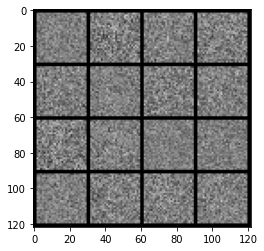

In [ ]:
x,y = next(iter(dataloader))
print(x.shape,y.shape)
print(y[:10])


noise = gen_noise(bs,z_dim)
fake = gen(noise)
show(fake)

In [ ]:
# Calculating the loss


# generator loss
def calc_gen_loss(loss_func, gen, disc,number, z_dim):
  noise = gen_noise(number,z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred)

  gen_loss = loss_func(pred,targets)

  return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number,z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake,disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss)/2


  return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

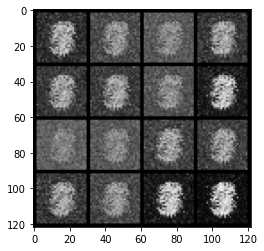

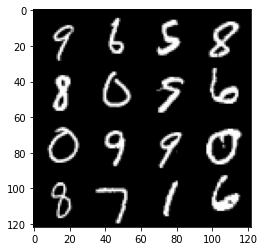

0: step 300 / Gen loss: 6.272832191785179 / disc_loss: 0.026283970124398686


  0%|          | 0/469 [00:00<?, ?it/s]

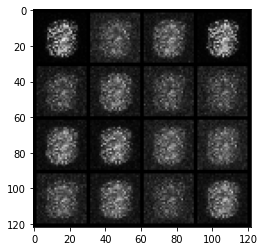

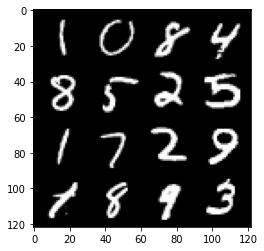

1: step 600 / Gen loss: 6.960088977813714 / disc_loss: 0.04532459046070778


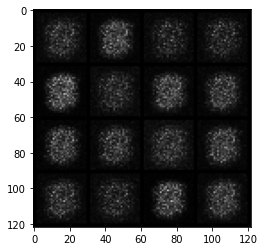

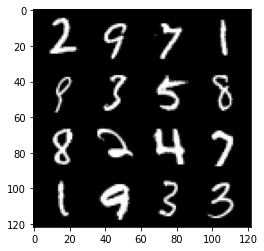

1: step 900 / Gen loss: 5.078068381945288 / disc_loss: 0.042250044289976356


  0%|          | 0/469 [00:00<?, ?it/s]

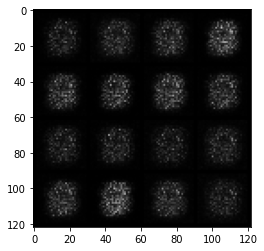

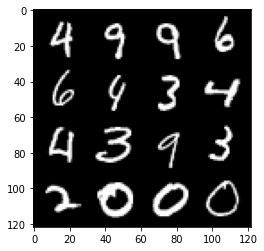

2: step 1200 / Gen loss: 4.0261135085423785 / disc_loss: 0.03823253935823839


  0%|          | 0/469 [00:00<?, ?it/s]

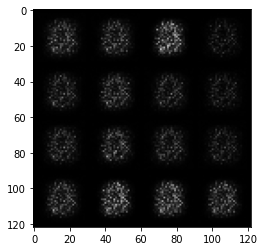

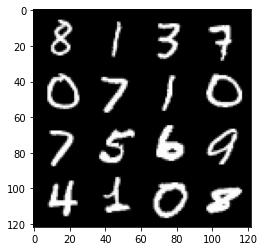

3: step 1500 / Gen loss: 3.606701840559641 / disc_loss: 0.03346701759224136


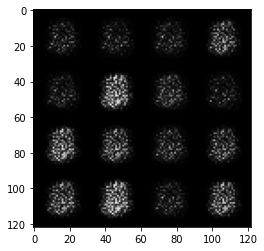

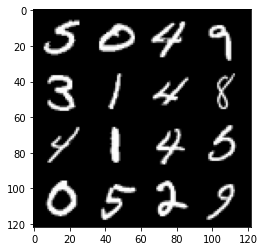

3: step 1800 / Gen loss: 3.818585013548531 / disc_loss: 0.024354464681819083


  0%|          | 0/469 [00:00<?, ?it/s]

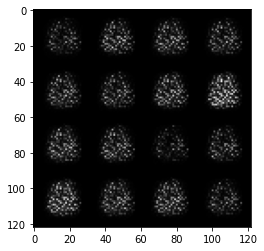

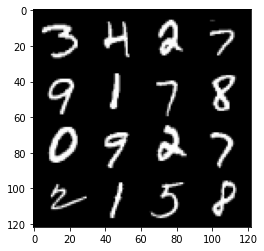

4: step 2100 / Gen loss: 4.400737148920697 / disc_loss: 0.015242080657432478


  0%|          | 0/469 [00:00<?, ?it/s]

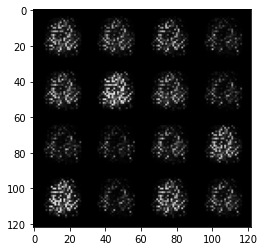

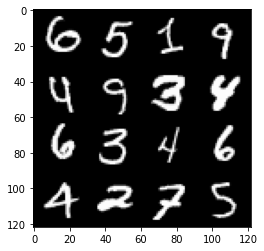

5: step 2400 / Gen loss: 5.119082740147907 / disc_loss: 0.010062628580878178


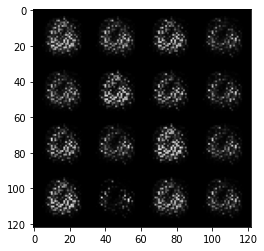

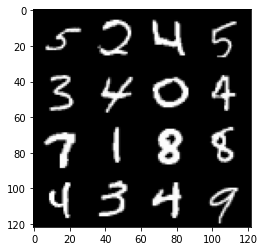

5: step 2700 / Gen loss: 5.502609936396277 / disc_loss: 0.007890439028075593


  0%|          | 0/469 [00:00<?, ?it/s]

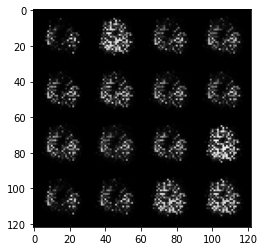

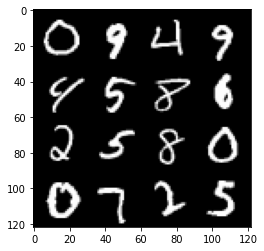

6: step 3000 / Gen loss: 5.50993141969045 / disc_loss: 0.007289812202410157


  0%|          | 0/469 [00:00<?, ?it/s]

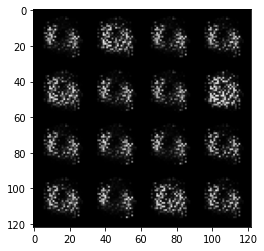

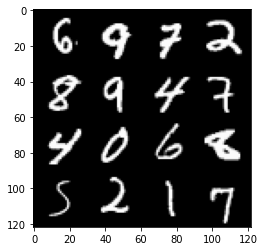

7: step 3300 / Gen loss: 5.79963716030121 / disc_loss: 0.006921559472102675


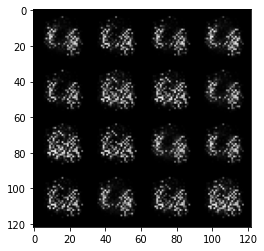

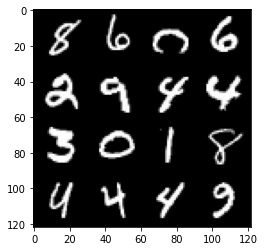

7: step 3600 / Gen loss: 6.4659651724497476 / disc_loss: 0.0059158919759405145


  0%|          | 0/469 [00:00<?, ?it/s]

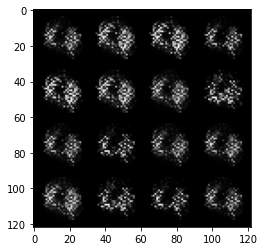

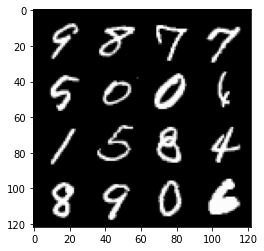

8: step 3900 / Gen loss: 8.337179994583128 / disc_loss: 0.00552410361861499


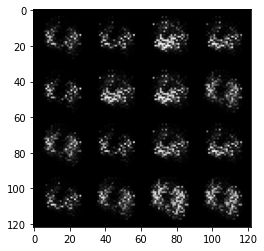

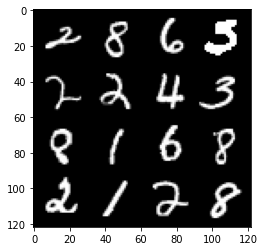

8: step 4200 / Gen loss: 8.904884707132975 / disc_loss: 0.004722359771452221


  0%|          | 0/469 [00:00<?, ?it/s]

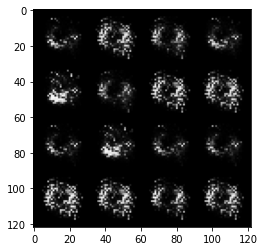

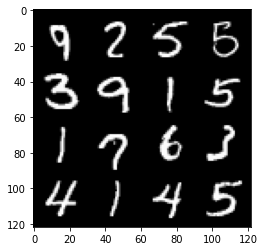

9: step 4500 / Gen loss: 7.232468773523965 / disc_loss: 0.00464217923892041


  0%|          | 0/469 [00:00<?, ?it/s]

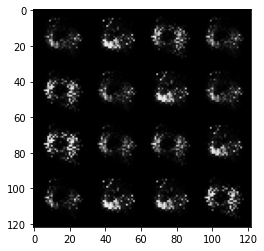

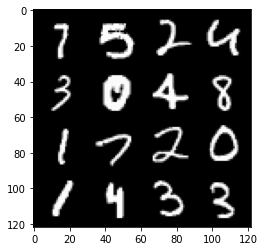

10: step 4800 / Gen loss: 6.5597825972239185 / disc_loss: 0.005544980619257939


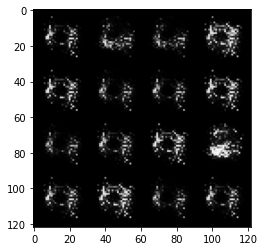

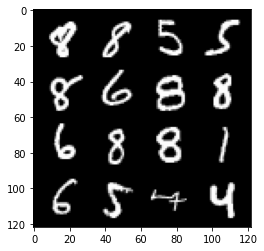

10: step 5100 / Gen loss: 6.0799526548385625 / disc_loss: 0.005628871786175297


  0%|          | 0/469 [00:00<?, ?it/s]

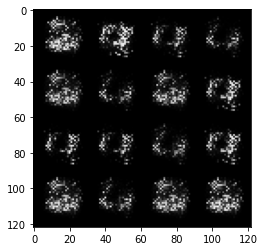

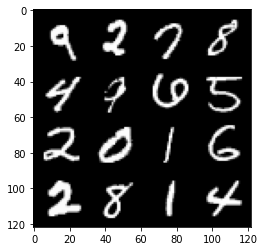

11: step 5400 / Gen loss: 6.3361830170949345 / disc_loss: 0.0054944125605591925


  0%|          | 0/469 [00:00<?, ?it/s]

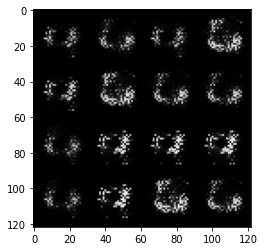

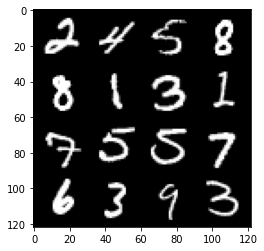

12: step 5700 / Gen loss: 7.135794041951502 / disc_loss: 0.0049027679480301845


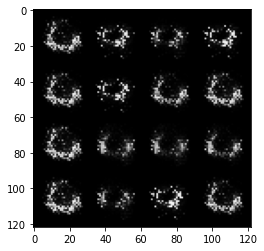

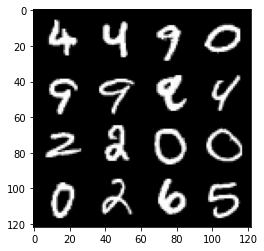

12: step 6000 / Gen loss: 6.612683370908098 / disc_loss: 0.004765795541849612


  0%|          | 0/469 [00:00<?, ?it/s]

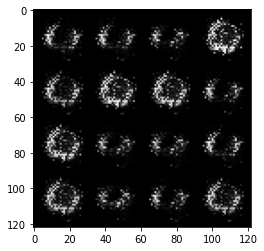

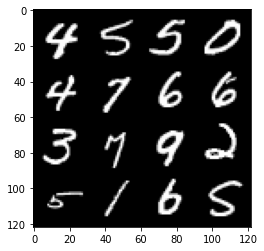

13: step 6300 / Gen loss: 6.646993242899576 / disc_loss: 0.005924142600658039


  0%|          | 0/469 [00:00<?, ?it/s]

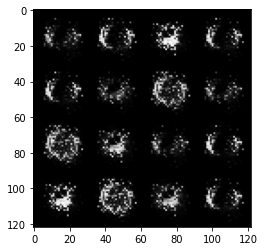

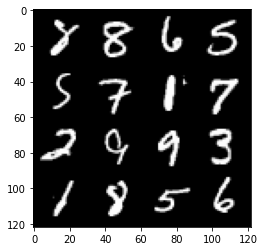

14: step 6600 / Gen loss: 7.115061475435898 / disc_loss: 0.005777430036105216


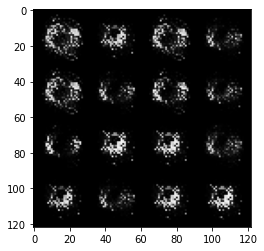

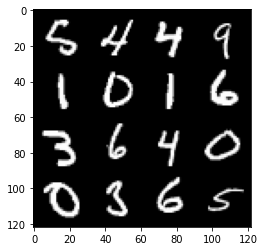

14: step 6900 / Gen loss: 7.05285460948944 / disc_loss: 0.0049877681255263


  0%|          | 0/469 [00:00<?, ?it/s]

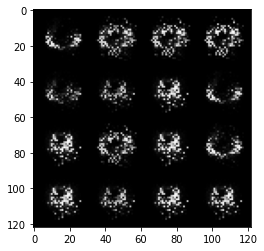

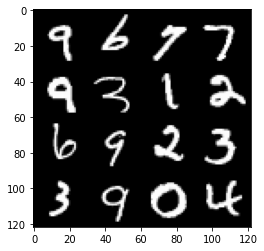

15: step 7200 / Gen loss: 7.052368508974709 / disc_loss: 0.003851994795065065


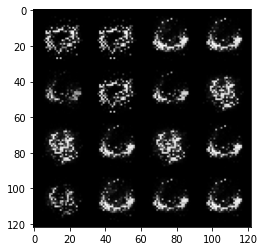

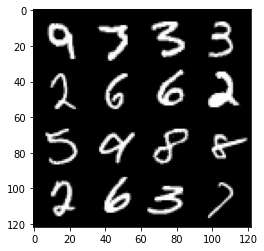

15: step 7500 / Gen loss: 7.493424490292862 / disc_loss: 0.004192524677103694


  0%|          | 0/469 [00:00<?, ?it/s]

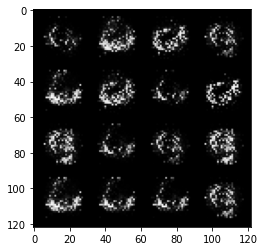

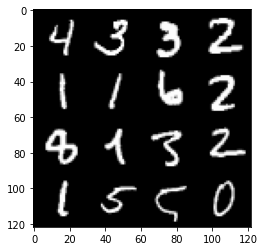

16: step 7800 / Gen loss: 7.515557870864865 / disc_loss: 0.004061733522297191


  0%|          | 0/469 [00:00<?, ?it/s]

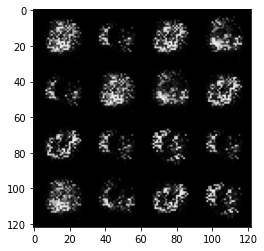

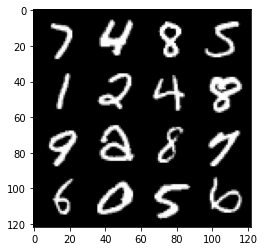

17: step 8100 / Gen loss: 7.28772044181824 / disc_loss: 0.005085801322323584


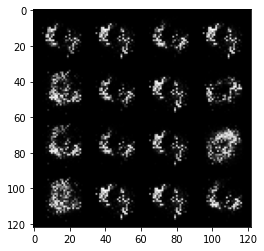

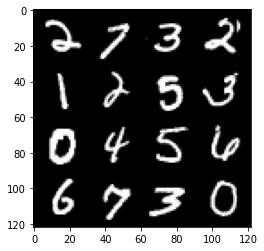

17: step 8400 / Gen loss: 6.559399056434624 / disc_loss: 0.006552958196261896


  0%|          | 0/469 [00:00<?, ?it/s]

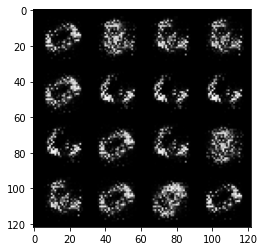

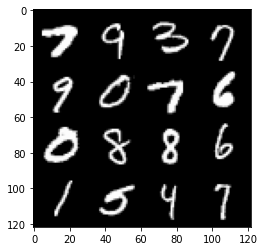

18: step 8700 / Gen loss: 6.398117567698159 / disc_loss: 0.006213379315255828


  0%|          | 0/469 [00:00<?, ?it/s]

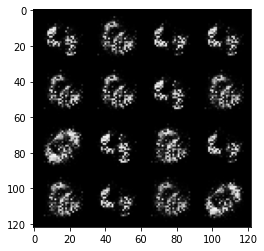

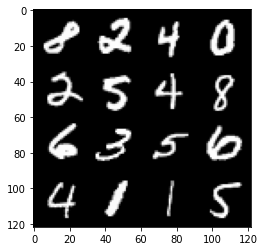

19: step 9000 / Gen loss: 6.232559137344362 / disc_loss: 0.007204239986216022


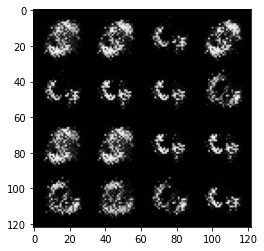

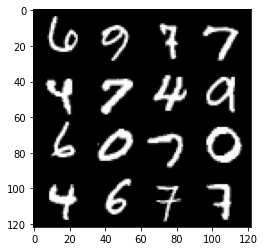

19: step 9300 / Gen loss: 6.054379445711771 / disc_loss: 0.008879976574098688


  0%|          | 0/469 [00:00<?, ?it/s]

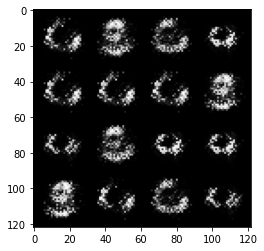

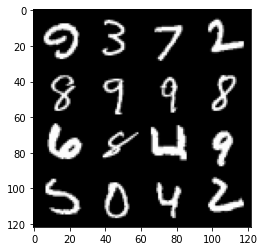

20: step 9600 / Gen loss: 6.492926905949911 / disc_loss: 0.007595891959499565


  0%|          | 0/469 [00:00<?, ?it/s]

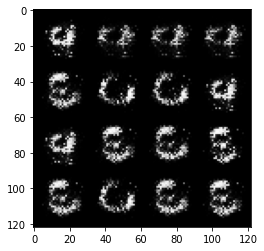

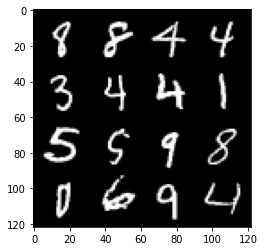

21: step 9900 / Gen loss: 6.263841117223107 / disc_loss: 0.008836748005123818


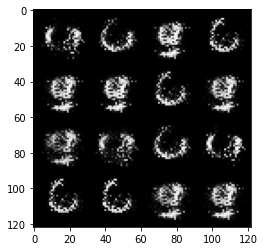

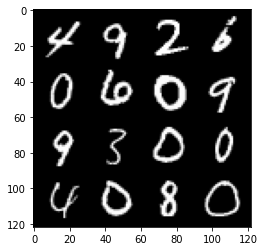

21: step 10200 / Gen loss: 6.104979505538939 / disc_loss: 0.007954642021795737


  0%|          | 0/469 [00:00<?, ?it/s]

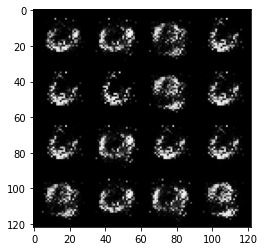

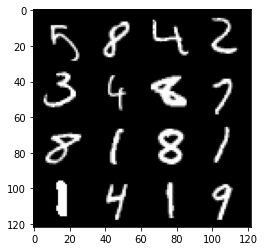

22: step 10500 / Gen loss: 6.339654479026799 / disc_loss: 0.006895115664228797


  0%|          | 0/469 [00:00<?, ?it/s]

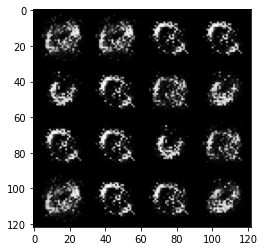

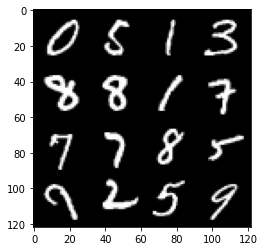

23: step 10800 / Gen loss: 6.593752759297693 / disc_loss: 0.0066592905612196775


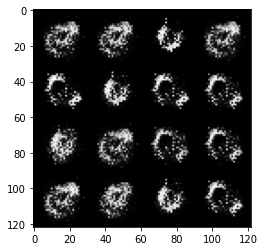

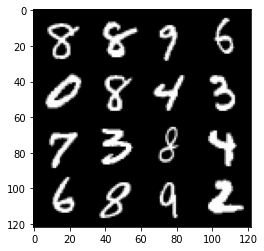

23: step 11100 / Gen loss: 6.669983592033389 / disc_loss: 0.007234575263379761


  0%|          | 0/469 [00:00<?, ?it/s]

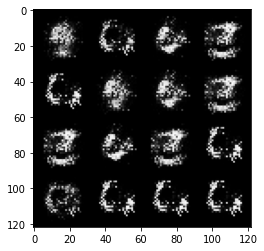

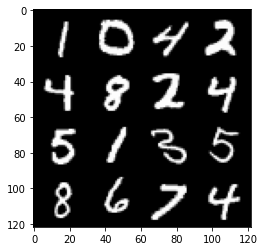

24: step 11400 / Gen loss: 6.978687837918598 / disc_loss: 0.00805622931220569


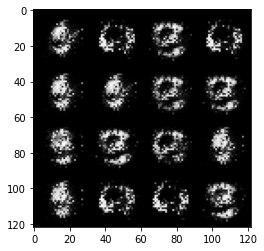

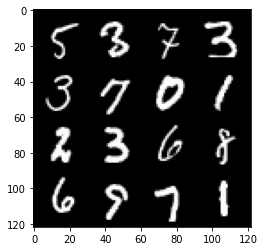

24: step 11700 / Gen loss: 6.680972503026322 / disc_loss: 0.008471656527253797


  0%|          | 0/469 [00:00<?, ?it/s]

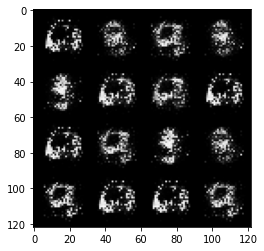

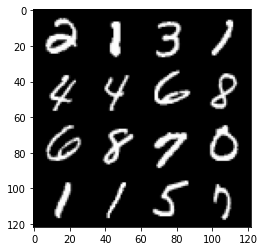

25: step 12000 / Gen loss: 6.901234520276379 / disc_loss: 0.008250879253221991


  0%|          | 0/469 [00:00<?, ?it/s]

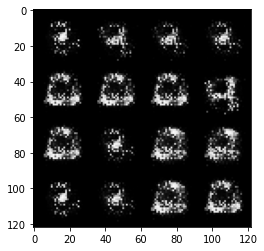

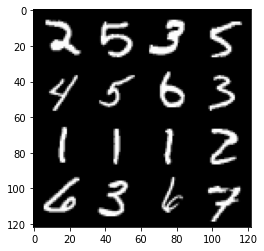

26: step 12300 / Gen loss: 6.475714852015173 / disc_loss: 0.00809630394098349


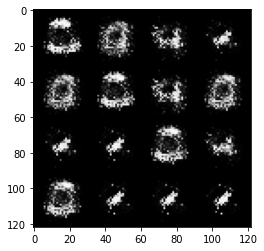

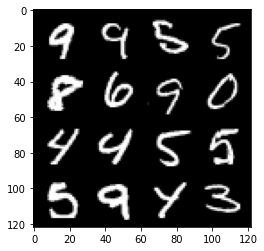

26: step 12600 / Gen loss: 6.518168447812398 / disc_loss: 0.007657190472042809


  0%|          | 0/469 [00:00<?, ?it/s]

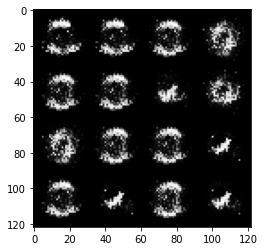

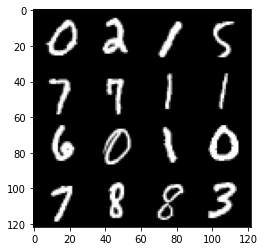

27: step 12900 / Gen loss: 6.252739191055297 / disc_loss: 0.008857413819835833


  0%|          | 0/469 [00:00<?, ?it/s]

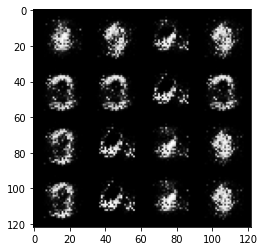

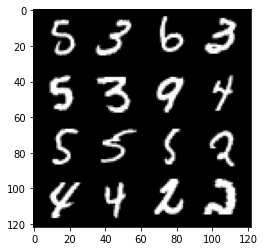

28: step 13200 / Gen loss: 5.83892616430918 / disc_loss: 0.012357616904967767


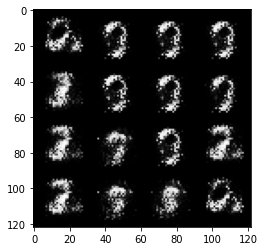

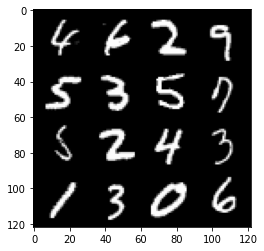

28: step 13500 / Gen loss: 6.20794242540995 / disc_loss: 0.010844180915349496


  0%|          | 0/469 [00:00<?, ?it/s]

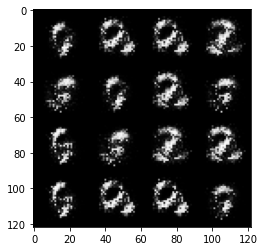

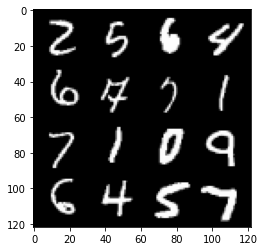

29: step 13800 / Gen loss: 6.209255007108057 / disc_loss: 0.0126924898630629


  0%|          | 0/469 [00:00<?, ?it/s]

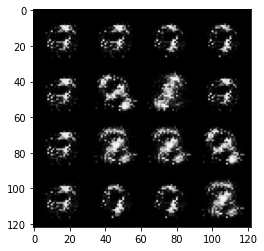

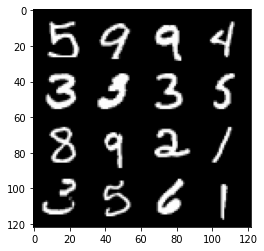

30: step 14100 / Gen loss: 6.014944020907081 / disc_loss: 0.01352970319295612


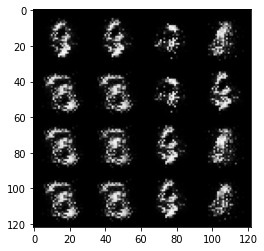

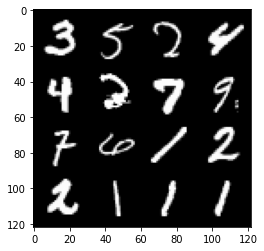

30: step 14400 / Gen loss: 5.898553333282477 / disc_loss: 0.016778075660889343


  0%|          | 0/469 [00:00<?, ?it/s]

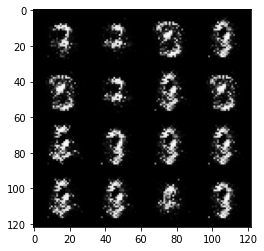

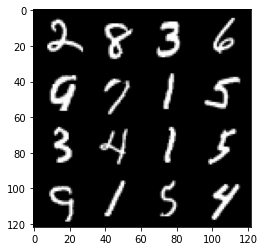

31: step 14700 / Gen loss: 5.851093211174012 / disc_loss: 0.014855361912244304


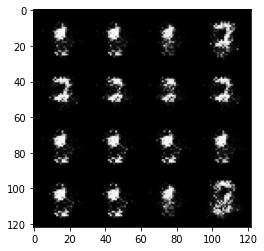

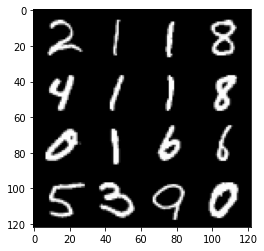

31: step 15000 / Gen loss: 5.807027045885723 / disc_loss: 0.018578755711981424


  0%|          | 0/469 [00:00<?, ?it/s]

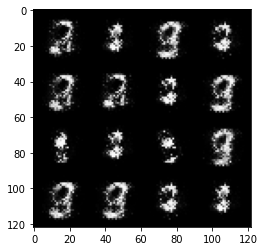

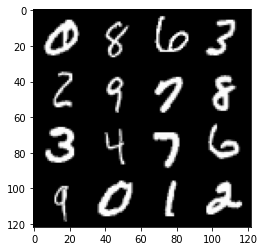

32: step 15300 / Gen loss: 5.531302421887719 / disc_loss: 0.022713170728335796


  0%|          | 0/469 [00:00<?, ?it/s]

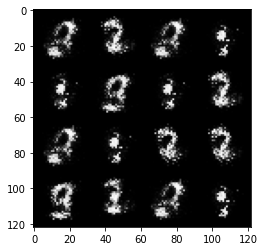

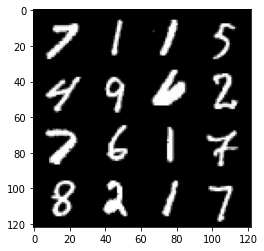

33: step 15600 / Gen loss: 5.647376462618513 / disc_loss: 0.017370460434661564


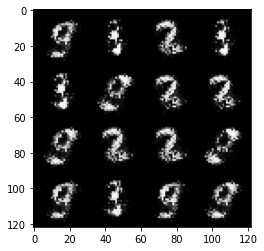

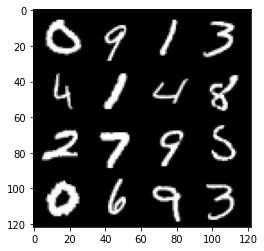

33: step 15900 / Gen loss: 5.536040809949239 / disc_loss: 0.014609619760885822


  0%|          | 0/469 [00:00<?, ?it/s]

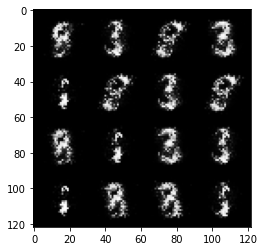

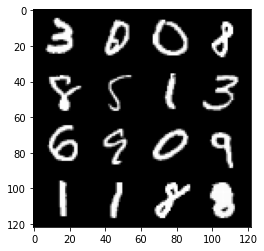

34: step 16200 / Gen loss: 5.385471316973368 / disc_loss: 0.018153385087692483


  0%|          | 0/469 [00:00<?, ?it/s]

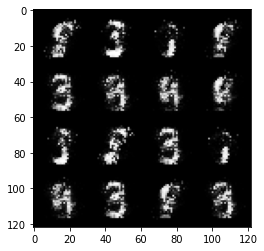

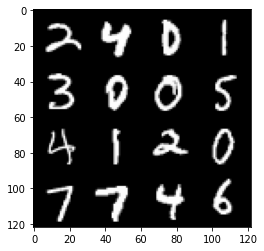

35: step 16500 / Gen loss: 5.288254276911415 / disc_loss: 0.02018705670488997


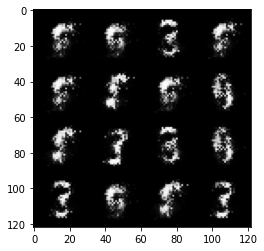

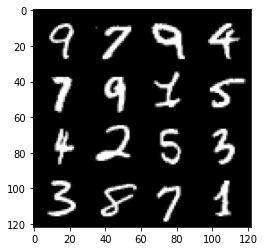

35: step 16800 / Gen loss: 5.611074105898541 / disc_loss: 0.023586964379064736


  0%|          | 0/469 [00:00<?, ?it/s]

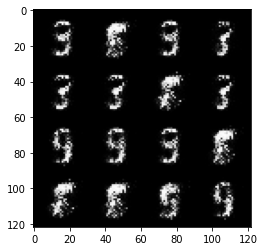

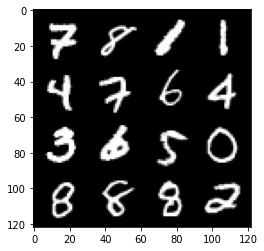

36: step 17100 / Gen loss: 5.369350056648257 / disc_loss: 0.024014992508261175


  0%|          | 0/469 [00:00<?, ?it/s]

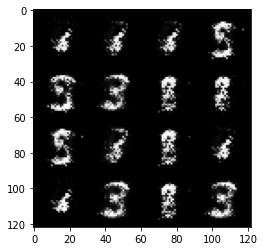

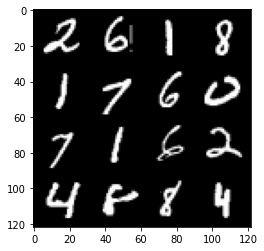

37: step 17400 / Gen loss: 5.6872950299580864 / disc_loss: 0.018788694576360288


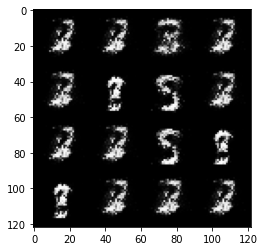

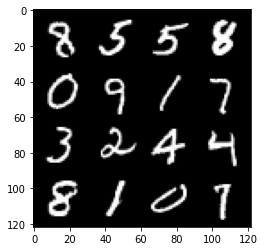

37: step 17700 / Gen loss: 5.671215659777324 / disc_loss: 0.015142075888191655


  0%|          | 0/469 [00:00<?, ?it/s]

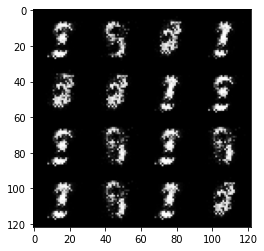

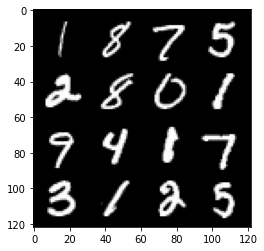

38: step 18000 / Gen loss: 5.699065620104472 / disc_loss: 0.016899701936636126


  0%|          | 0/469 [00:00<?, ?it/s]

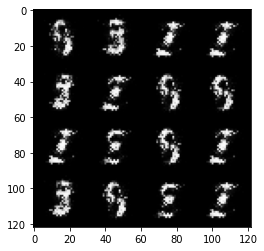

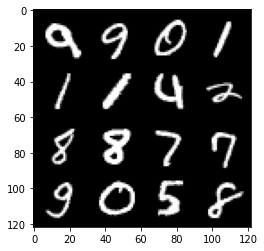

39: step 18300 / Gen loss: 5.747983969052638 / disc_loss: 0.01535390182863922


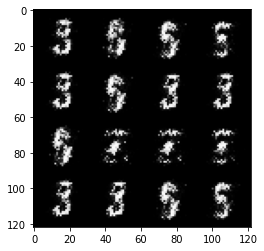

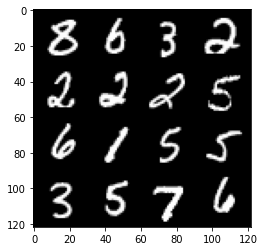

39: step 18600 / Gen loss: 5.596128036181132 / disc_loss: 0.016343583801450828


  0%|          | 0/469 [00:00<?, ?it/s]

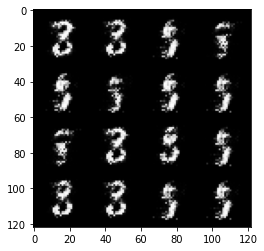

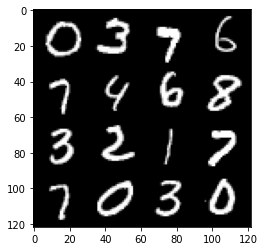

40: step 18900 / Gen loss: 5.523530109723411 / disc_loss: 0.015271502009515327


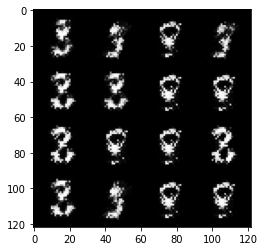

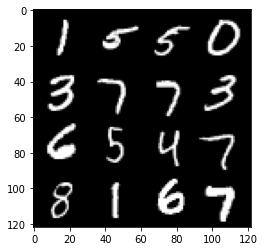

40: step 19200 / Gen loss: 5.568508714040119 / disc_loss: 0.01742448989069089


  0%|          | 0/469 [00:00<?, ?it/s]

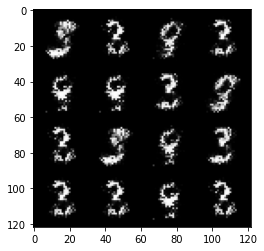

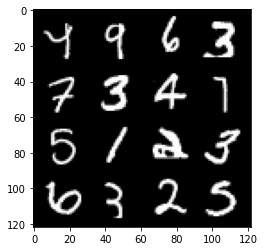

41: step 19500 / Gen loss: 6.103107827504477 / disc_loss: 0.01319105517352


  0%|          | 0/469 [00:00<?, ?it/s]

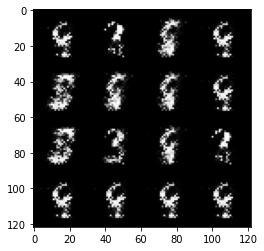

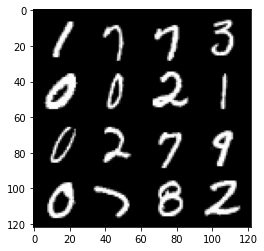

42: step 19800 / Gen loss: 6.410606668790185 / disc_loss: 0.010248354849560808


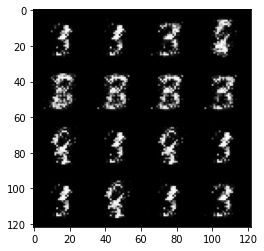

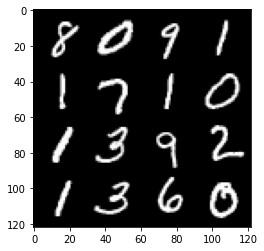

42: step 20100 / Gen loss: 5.980969150861102 / disc_loss: 0.012282019617074785


  0%|          | 0/469 [00:00<?, ?it/s]

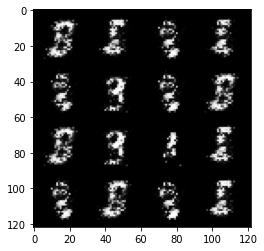

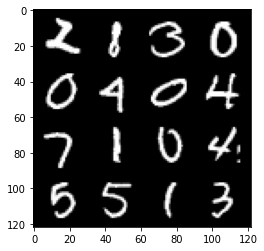

43: step 20400 / Gen loss: 6.222195417086287 / disc_loss: 0.014133666642786312


  0%|          | 0/469 [00:00<?, ?it/s]

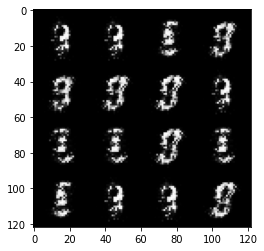

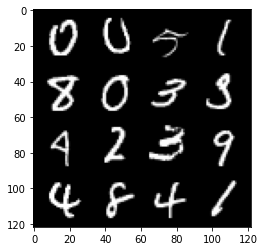

44: step 20700 / Gen loss: 5.623537382284798 / disc_loss: 0.017888648791704334


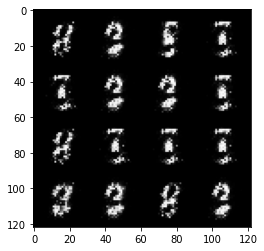

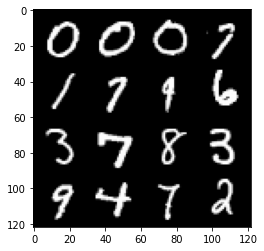

44: step 21000 / Gen loss: 5.588949515024821 / disc_loss: 0.01927039723300064


  0%|          | 0/469 [00:00<?, ?it/s]

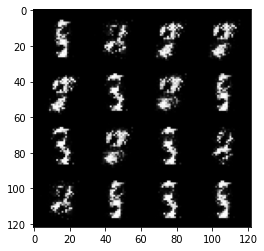

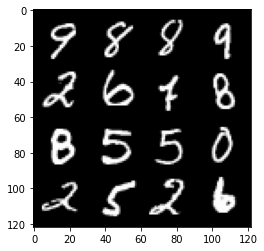

45: step 21300 / Gen loss: 5.675489219029745 / disc_loss: 0.016482205784413954


  0%|          | 0/469 [00:00<?, ?it/s]

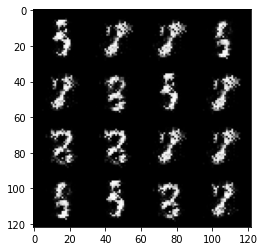

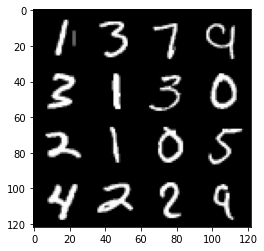

46: step 21600 / Gen loss: 6.134721630414326 / disc_loss: 0.017539306505738466


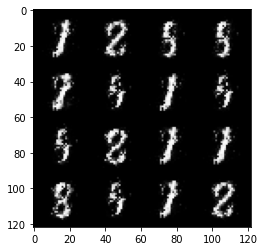

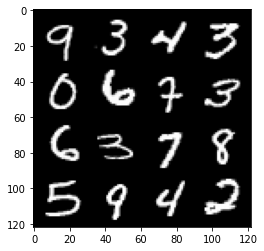

46: step 21900 / Gen loss: 5.792815178235372 / disc_loss: 0.01808992585283705


  0%|          | 0/469 [00:00<?, ?it/s]

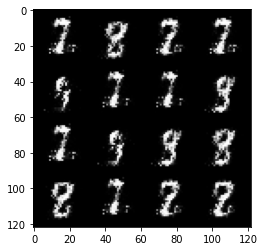

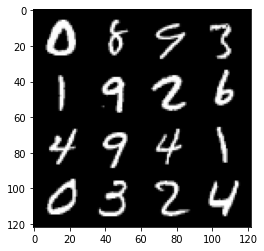

47: step 22200 / Gen loss: 5.743023306528728 / disc_loss: 0.022796451668255016


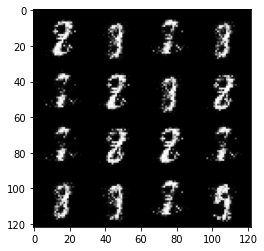

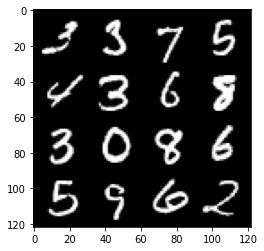

47: step 22500 / Gen loss: 6.327258931795756 / disc_loss: 0.01647492247944076


  0%|          | 0/469 [00:00<?, ?it/s]

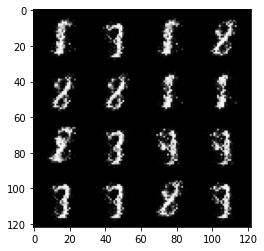

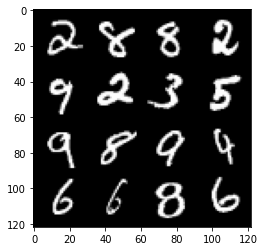

48: step 22800 / Gen loss: 6.180007101694745 / disc_loss: 0.020529345198689652


  0%|          | 0/469 [00:00<?, ?it/s]

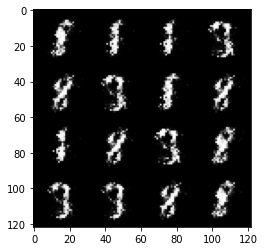

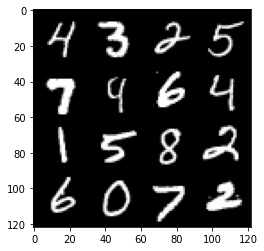

49: step 23100 / Gen loss: 5.866075048446659 / disc_loss: 0.017908901172146816


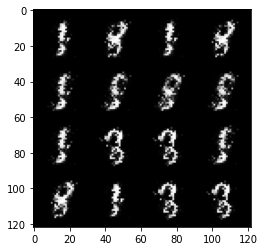

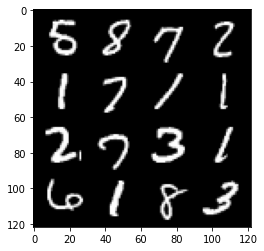

49: step 23400 / Gen loss: 5.783917042414348 / disc_loss: 0.01902152098948137


  0%|          | 0/469 [00:00<?, ?it/s]

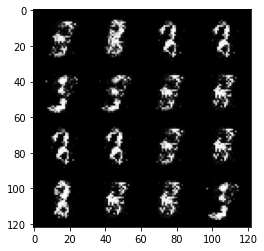

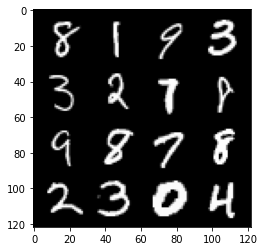

50: step 23700 / Gen loss: 5.90770768165588 / disc_loss: 0.018124801910016697


  0%|          | 0/469 [00:00<?, ?it/s]

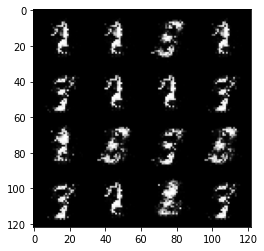

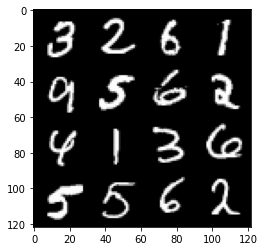

51: step 24000 / Gen loss: 5.963913256327308 / disc_loss: 0.018151039136573673


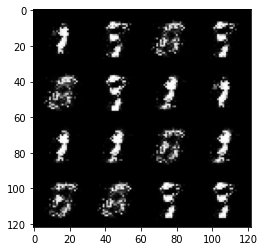

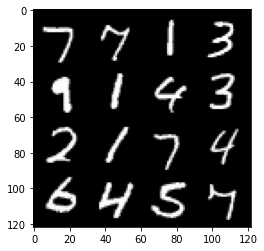

51: step 24300 / Gen loss: 6.418444320360815 / disc_loss: 0.01562682203948497


  0%|          | 0/469 [00:00<?, ?it/s]

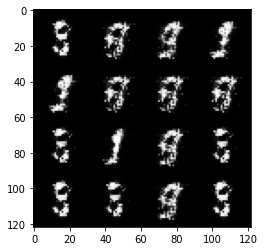

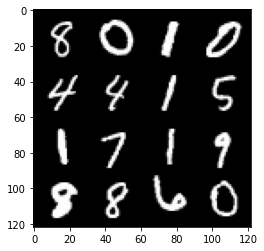

52: step 24600 / Gen loss: 6.6209341589609805 / disc_loss: 0.02046315960741292


  0%|          | 0/469 [00:00<?, ?it/s]

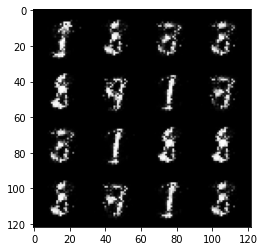

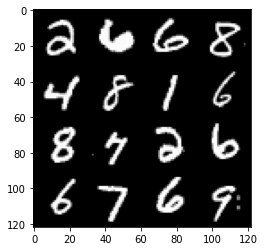

53: step 24900 / Gen loss: 5.8808976936340365 / disc_loss: 0.02891220404456059


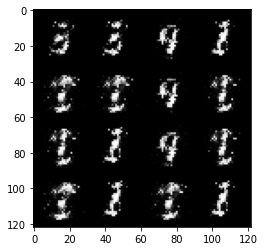

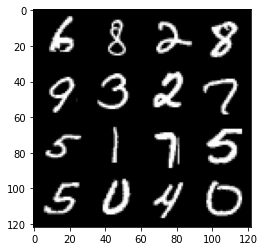

53: step 25200 / Gen loss: 5.845863747596747 / disc_loss: 0.02311945826203251


  0%|          | 0/469 [00:00<?, ?it/s]

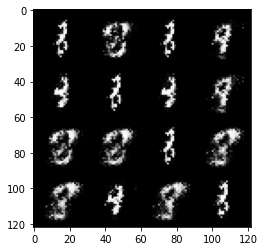

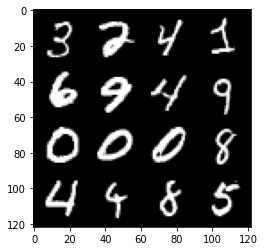

54: step 25500 / Gen loss: 6.367799356778467 / disc_loss: 0.018928365733784928


  0%|          | 0/469 [00:00<?, ?it/s]

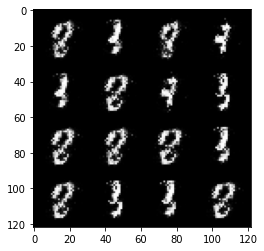

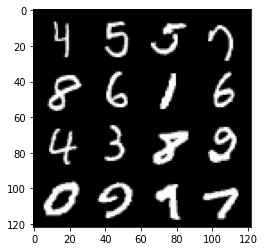

55: step 25800 / Gen loss: 5.822455789248147 / disc_loss: 0.026306567492817224


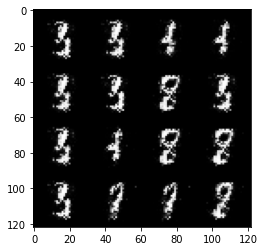

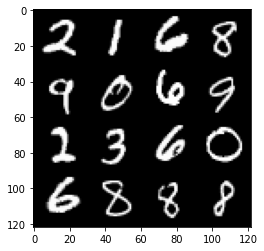

55: step 26100 / Gen loss: 5.6935678497950235 / disc_loss: 0.021810971774005636


  0%|          | 0/469 [00:00<?, ?it/s]

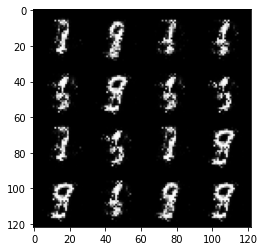

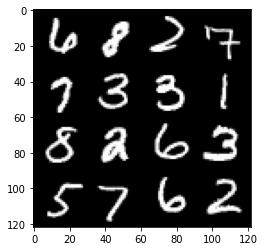

56: step 26400 / Gen loss: 5.916115107536316 / disc_loss: 0.017829605208244177


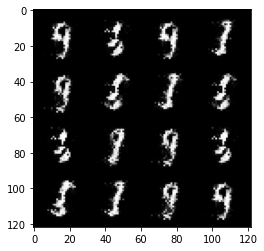

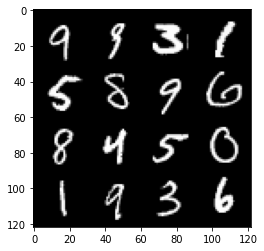

56: step 26700 / Gen loss: 6.21925255298615 / disc_loss: 0.018122494433385632


  0%|          | 0/469 [00:00<?, ?it/s]

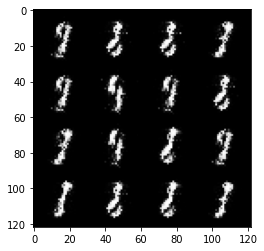

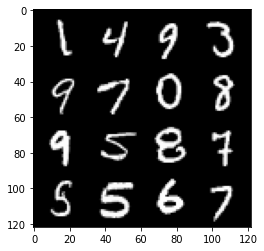

57: step 27000 / Gen loss: 5.761684144337973 / disc_loss: 0.01693102210061624


  0%|          | 0/469 [00:00<?, ?it/s]

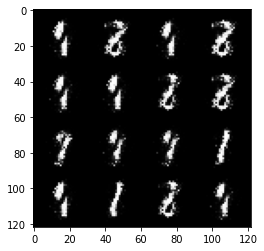

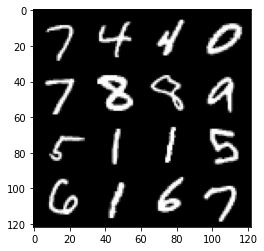

58: step 27300 / Gen loss: 5.632759340604146 / disc_loss: 0.024364372598938634


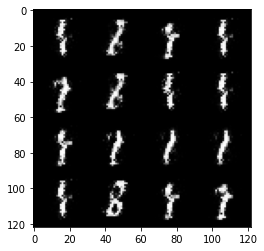

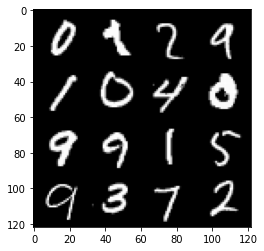

58: step 27600 / Gen loss: 5.312155268192296 / disc_loss: 0.027711185077981388


  0%|          | 0/469 [00:00<?, ?it/s]

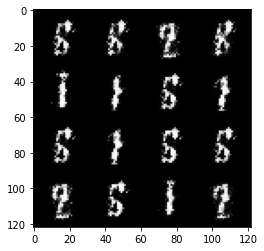

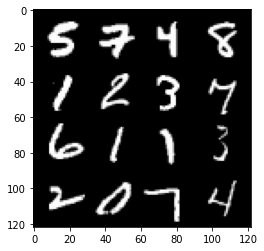

59: step 27900 / Gen loss: 5.790597043037413 / disc_loss: 0.030258319888574386


  0%|          | 0/469 [00:00<?, ?it/s]

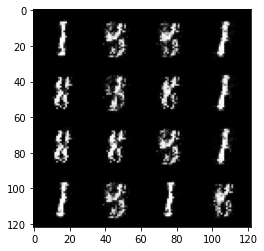

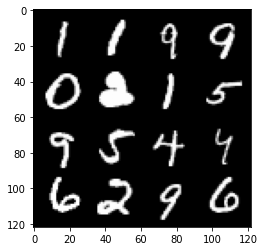

60: step 28200 / Gen loss: 5.653519903818769 / disc_loss: 0.02922093901162345


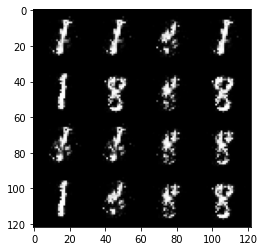

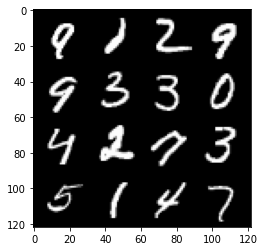

60: step 28500 / Gen loss: 5.581366454760233 / disc_loss: 0.02688048251283665


  0%|          | 0/469 [00:00<?, ?it/s]

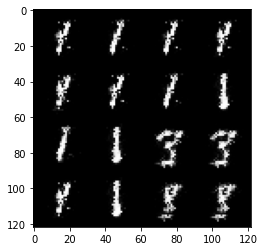

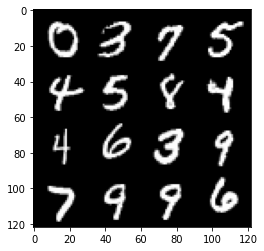

61: step 28800 / Gen loss: 5.996139090855912 / disc_loss: 0.02065936519997194


  0%|          | 0/469 [00:00<?, ?it/s]

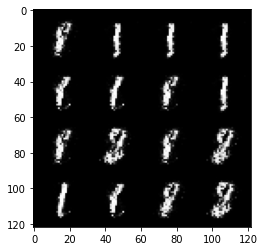

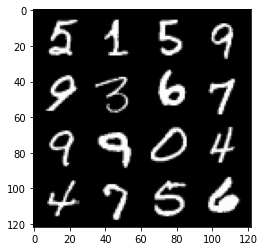

62: step 29100 / Gen loss: 5.405662153561911 / disc_loss: 0.032488738293759506


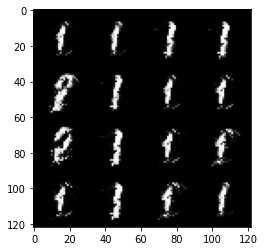

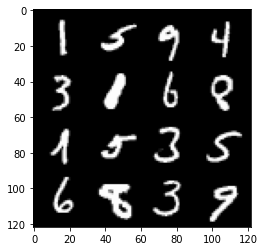

62: step 29400 / Gen loss: 5.173165496985119 / disc_loss: 0.036622801216629655


  0%|          | 0/469 [00:00<?, ?it/s]

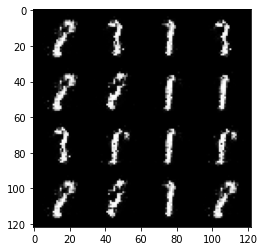

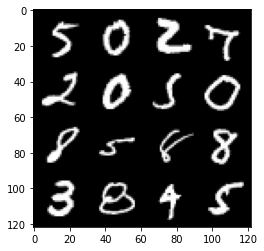

63: step 29700 / Gen loss: 5.3272886403401705 / disc_loss: 0.029424548380387328


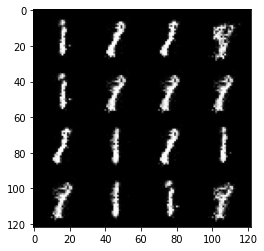

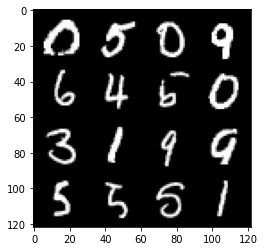

63: step 30000 / Gen loss: 5.647245275179545 / disc_loss: 0.02762231933884323


  0%|          | 0/469 [00:00<?, ?it/s]

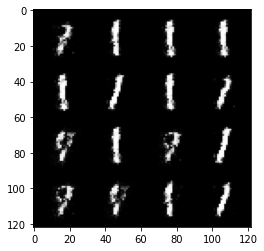

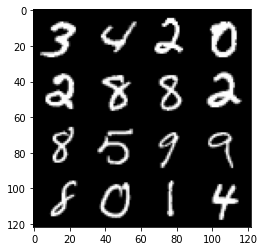

64: step 30300 / Gen loss: 5.339084017276764 / disc_loss: 0.04407158547857155


  0%|          | 0/469 [00:00<?, ?it/s]

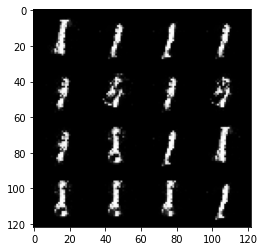

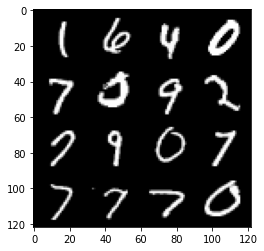

65: step 30600 / Gen loss: 5.280360939502715 / disc_loss: 0.04384594859555362


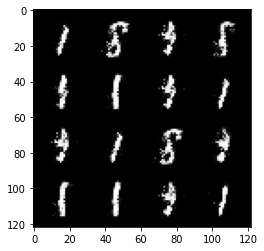

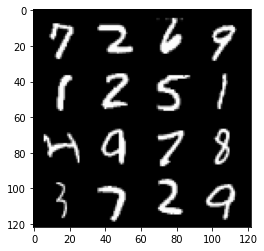

65: step 30900 / Gen loss: 5.398347733815508 / disc_loss: 0.031037358610580334


  0%|          | 0/469 [00:00<?, ?it/s]

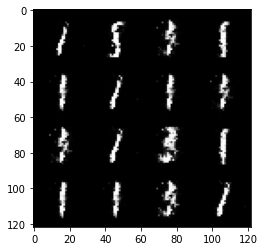

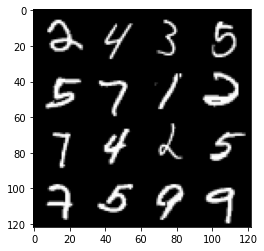

66: step 31200 / Gen loss: 5.014012625217436 / disc_loss: 0.030265961474118128


  0%|          | 0/469 [00:00<?, ?it/s]

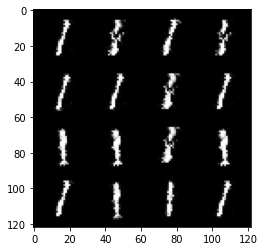

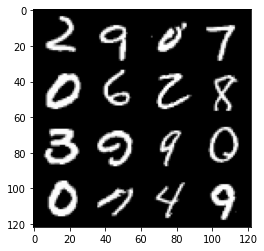

67: step 31500 / Gen loss: 5.184154792626699 / disc_loss: 0.03550273807098469


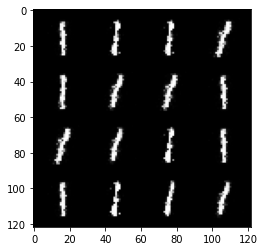

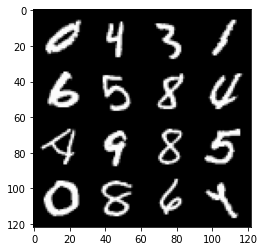

67: step 31800 / Gen loss: 4.579610446294148 / disc_loss: 0.05413910237451394


  0%|          | 0/469 [00:00<?, ?it/s]

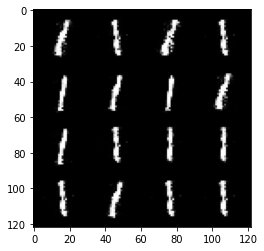

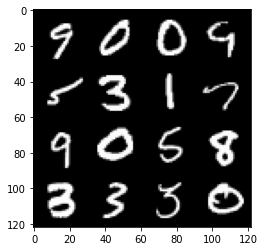

68: step 32100 / Gen loss: 4.162594571113586 / disc_loss: 0.07178254092112188


  0%|          | 0/469 [00:00<?, ?it/s]

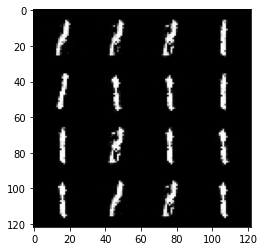

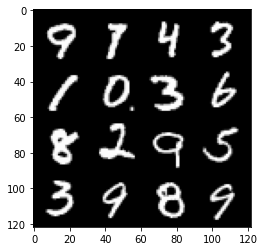

69: step 32400 / Gen loss: 4.308137906392416 / disc_loss: 0.0643502845118443


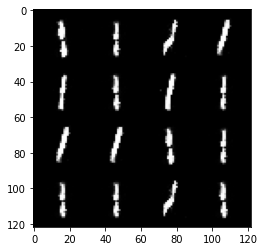

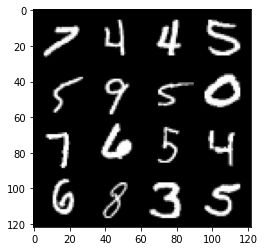

69: step 32700 / Gen loss: 4.252991268634793 / disc_loss: 0.058253997014835475


  0%|          | 0/469 [00:00<?, ?it/s]

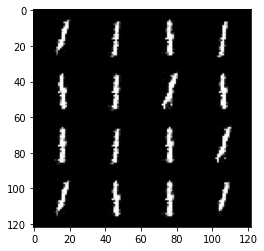

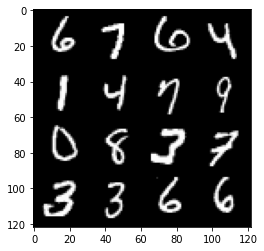

70: step 33000 / Gen loss: 4.500744839509327 / disc_loss: 0.05140026256752516


  0%|          | 0/469 [00:00<?, ?it/s]

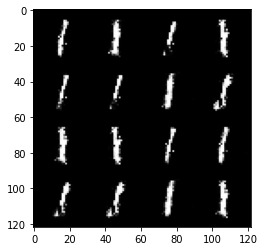

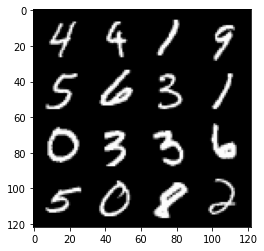

71: step 33300 / Gen loss: 4.887958974838254 / disc_loss: 0.05424848566763099


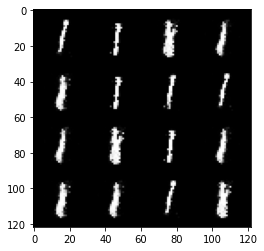

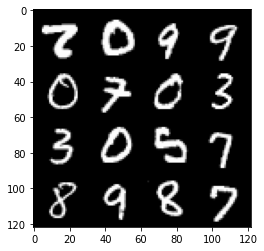

71: step 33600 / Gen loss: 4.48948098818461 / disc_loss: 0.05922169161339603


  0%|          | 0/469 [00:00<?, ?it/s]

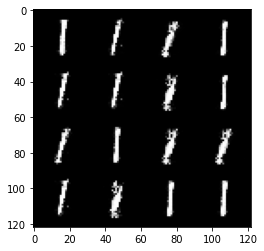

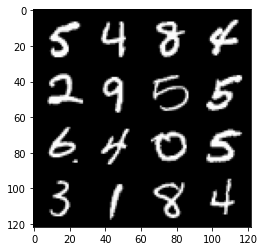

72: step 33900 / Gen loss: 4.416294991175332 / disc_loss: 0.06865369190772373


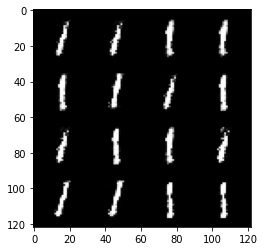

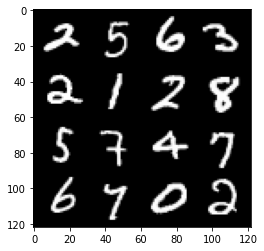

72: step 34200 / Gen loss: 4.135555719534557 / disc_loss: 0.08471100012461347


  0%|          | 0/469 [00:00<?, ?it/s]

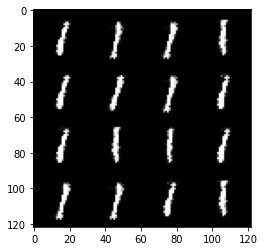

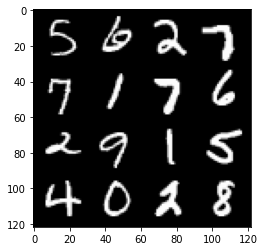

73: step 34500 / Gen loss: 4.431519609292347 / disc_loss: 0.0829702185528974


  0%|          | 0/469 [00:00<?, ?it/s]

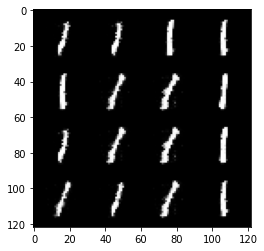

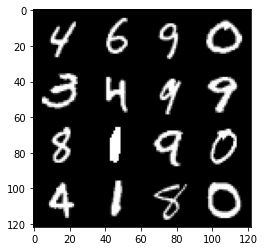

74: step 34800 / Gen loss: 4.41832138697306 / disc_loss: 0.08411282302811739


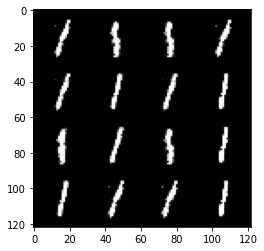

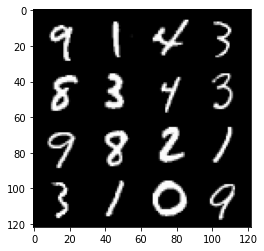

74: step 35100 / Gen loss: 4.084347162246703 / disc_loss: 0.07516130314519012


  0%|          | 0/469 [00:00<?, ?it/s]

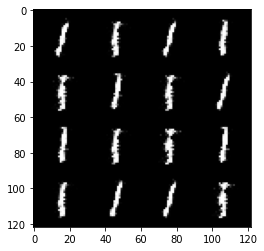

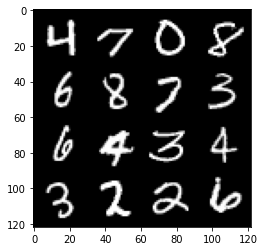

75: step 35400 / Gen loss: 4.438618996938068 / disc_loss: 0.06677342975822592


  0%|          | 0/469 [00:00<?, ?it/s]

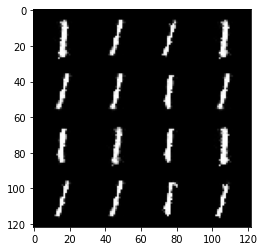

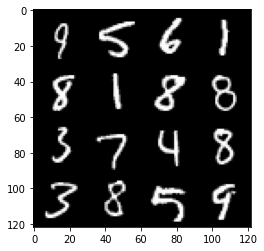

76: step 35700 / Gen loss: 4.364102741877235 / disc_loss: 0.06793221296742556


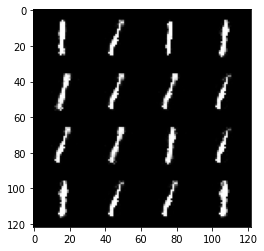

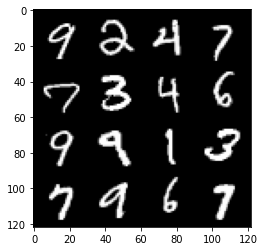

76: step 36000 / Gen loss: 4.226992897987369 / disc_loss: 0.0929979500329742


  0%|          | 0/469 [00:00<?, ?it/s]

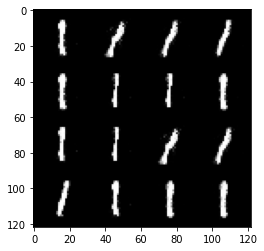

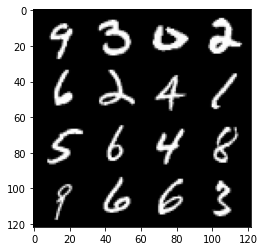

77: step 36300 / Gen loss: 4.4034711591402695 / disc_loss: 0.09911283048801119


  0%|          | 0/469 [00:00<?, ?it/s]

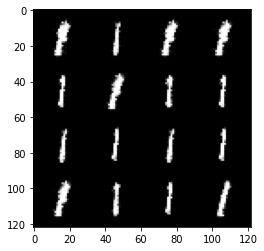

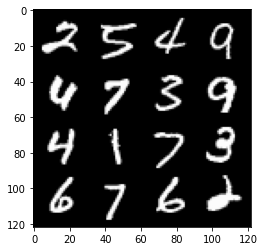

78: step 36600 / Gen loss: 4.122556958993276 / disc_loss: 0.08663324267293017


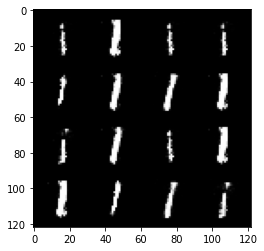

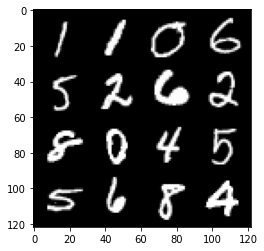

78: step 36900 / Gen loss: 4.266550861199696 / disc_loss: 0.09155832558870315


  0%|          | 0/469 [00:00<?, ?it/s]

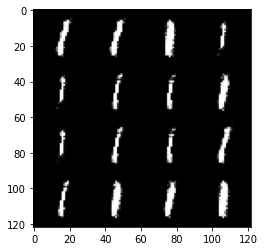

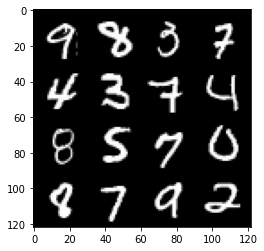

79: step 37200 / Gen loss: 4.3583401322364805 / disc_loss: 0.059765499345958234


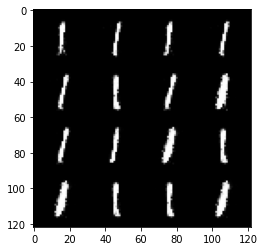

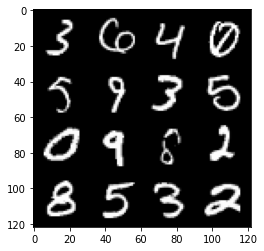

79: step 37500 / Gen loss: 4.317407430013021 / disc_loss: 0.08897013422101735


  0%|          | 0/469 [00:00<?, ?it/s]

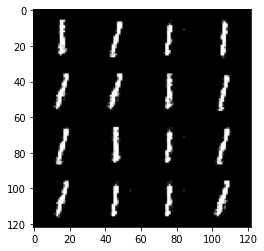

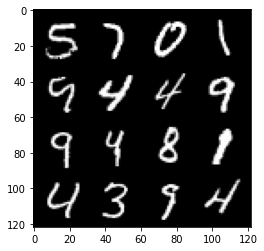

80: step 37800 / Gen loss: 4.177556254069006 / disc_loss: 0.10177859073504805


  0%|          | 0/469 [00:00<?, ?it/s]

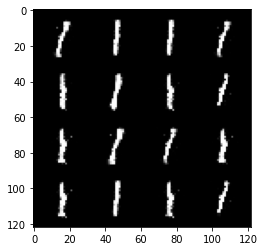

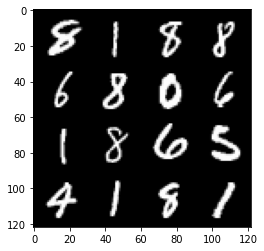

81: step 38100 / Gen loss: 3.8291317915916427 / disc_loss: 0.10940588100502889


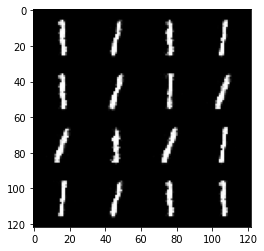

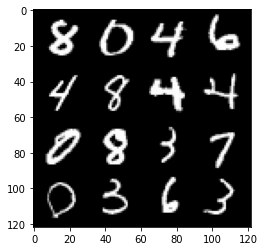

81: step 38400 / Gen loss: 3.9902620752652513 / disc_loss: 0.10614846717566262


  0%|          | 0/469 [00:00<?, ?it/s]

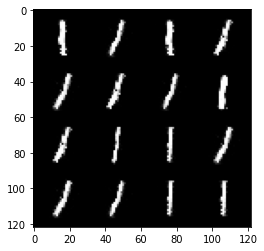

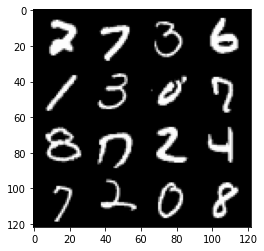

82: step 38700 / Gen loss: 3.864431394735972 / disc_loss: 0.10063454718639457


  0%|          | 0/469 [00:00<?, ?it/s]

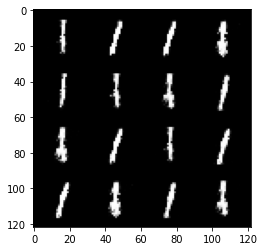

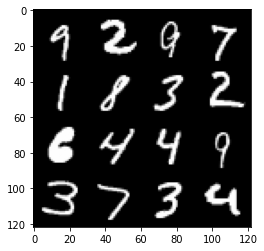

83: step 39000 / Gen loss: 3.7830638813972493 / disc_loss: 0.09791830504623555


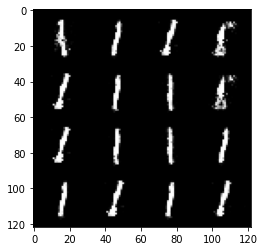

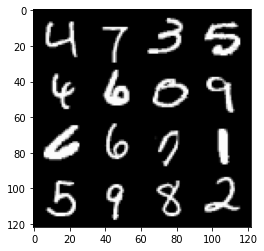

83: step 39300 / Gen loss: 4.088715248902642 / disc_loss: 0.09411912722513081


  0%|          | 0/469 [00:00<?, ?it/s]

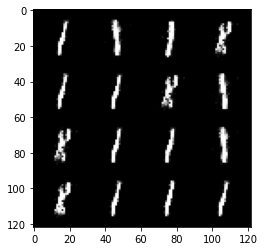

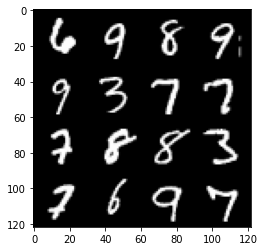

84: step 39600 / Gen loss: 4.344243464469914 / disc_loss: 0.10089252399280674


  0%|          | 0/469 [00:00<?, ?it/s]

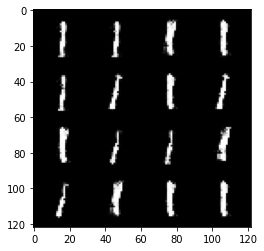

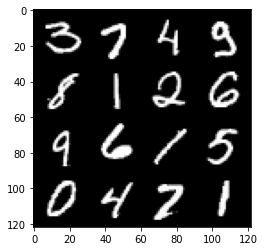

85: step 39900 / Gen loss: 3.8978967459996534 / disc_loss: 0.1003767727253337


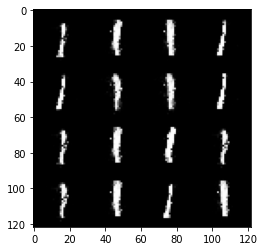

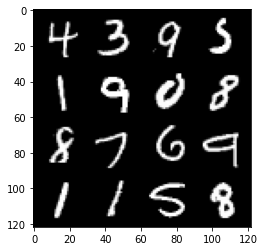

85: step 40200 / Gen loss: 3.8247545178731284 / disc_loss: 0.10380918351312485


  0%|          | 0/469 [00:00<?, ?it/s]

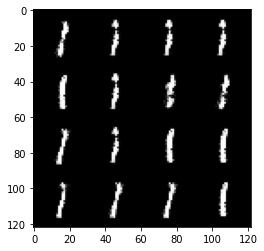

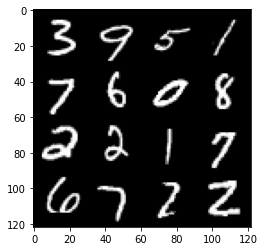

86: step 40500 / Gen loss: 3.9838243182500195 / disc_loss: 0.08744703082988663


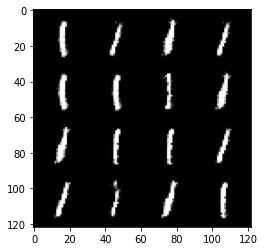

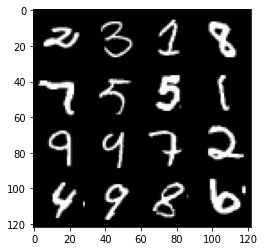

86: step 40800 / Gen loss: 4.199266028404235 / disc_loss: 0.09816826623243587


  0%|          | 0/469 [00:00<?, ?it/s]

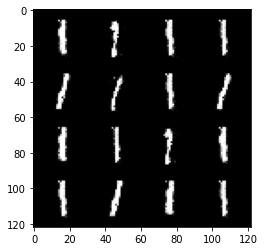

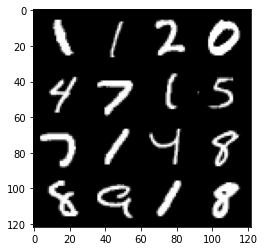

87: step 41100 / Gen loss: 3.821211399237315 / disc_loss: 0.11576644624272973


  0%|          | 0/469 [00:00<?, ?it/s]

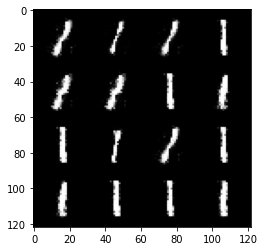

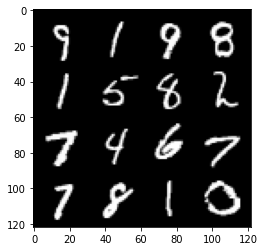

88: step 41400 / Gen loss: 3.8249951275189717 / disc_loss: 0.12284623903532825


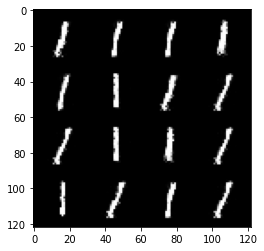

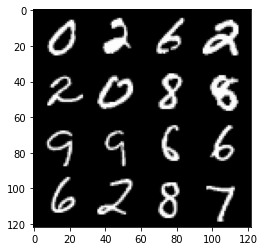

88: step 41700 / Gen loss: 3.740887289841969 / disc_loss: 0.09161987197274954


  0%|          | 0/469 [00:00<?, ?it/s]

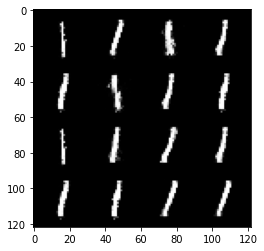

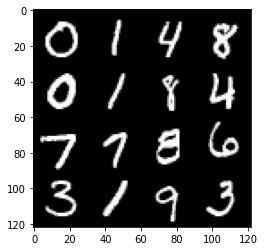

89: step 42000 / Gen loss: 3.661488006114961 / disc_loss: 0.15181304861481004


  0%|          | 0/469 [00:00<?, ?it/s]

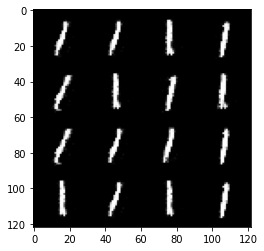

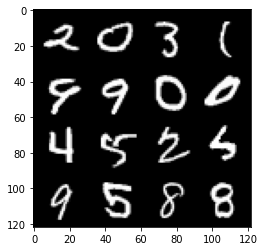

90: step 42300 / Gen loss: 3.461374754110974 / disc_loss: 0.13053362776835772


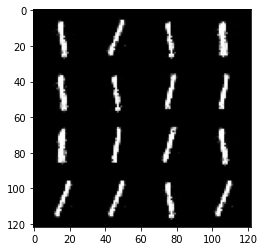

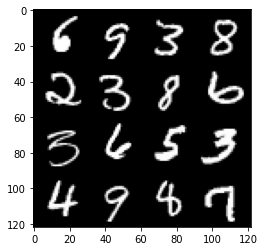

90: step 42600 / Gen loss: 3.760483293533326 / disc_loss: 0.10614647692690289


  0%|          | 0/469 [00:00<?, ?it/s]

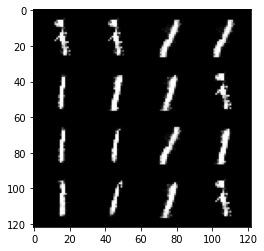

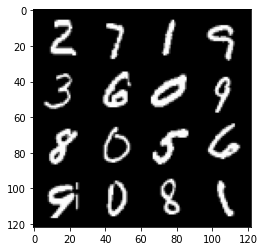

91: step 42900 / Gen loss: 3.915851644674936 / disc_loss: 0.10444243057320521


  0%|          | 0/469 [00:00<?, ?it/s]

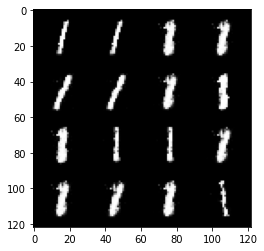

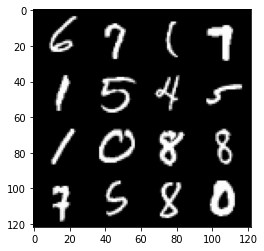

92: step 43200 / Gen loss: 3.8118030730883263 / disc_loss: 0.10669520137210685


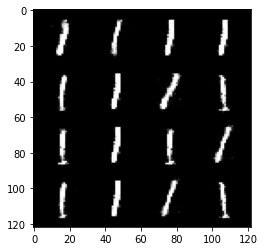

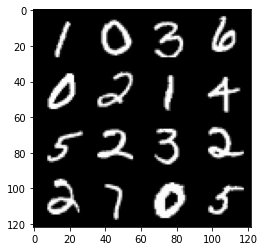

92: step 43500 / Gen loss: 3.5088724303245553 / disc_loss: 0.12732704979677986


  0%|          | 0/469 [00:00<?, ?it/s]

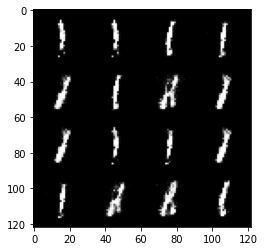

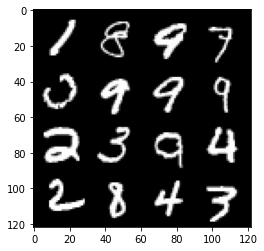

93: step 43800 / Gen loss: 3.5954579655329377 / disc_loss: 0.10341470409184696


  0%|          | 0/469 [00:00<?, ?it/s]

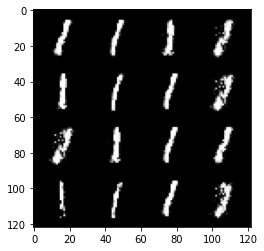

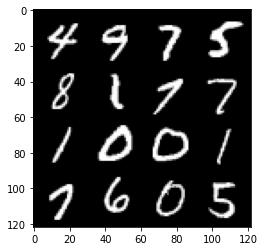

94: step 44100 / Gen loss: 3.689919378757476 / disc_loss: 0.09969590685019897


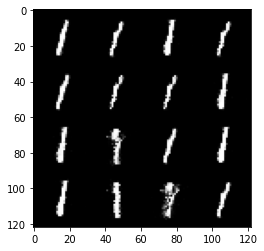

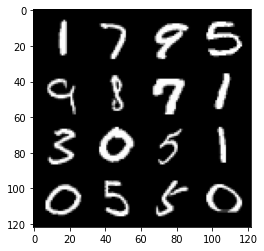

94: step 44400 / Gen loss: 3.9010881789525382 / disc_loss: 0.08724490329312783


  0%|          | 0/469 [00:00<?, ?it/s]

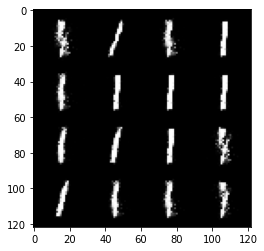

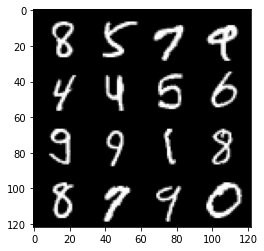

95: step 44700 / Gen loss: 3.7616830062866193 / disc_loss: 0.1337606430922946


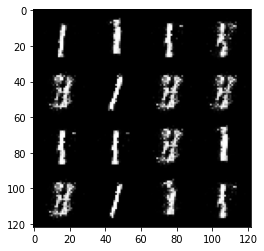

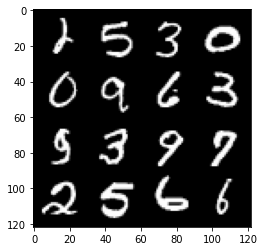

95: step 45000 / Gen loss: 3.9154992715517674 / disc_loss: 0.1377675032243133


  0%|          | 0/469 [00:00<?, ?it/s]

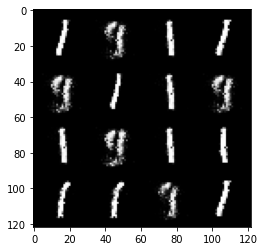

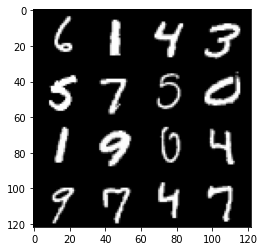

96: step 45300 / Gen loss: 3.720576993624372 / disc_loss: 0.10320072394485282


  0%|          | 0/469 [00:00<?, ?it/s]

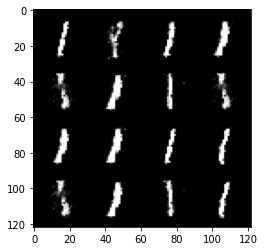

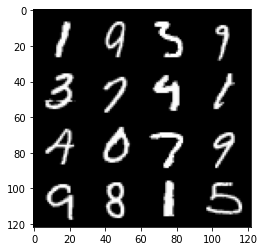

97: step 45600 / Gen loss: 3.700033161640166 / disc_loss: 0.139196286884447


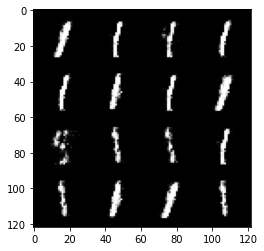

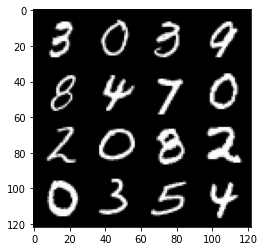

97: step 45900 / Gen loss: 3.666009832223256 / disc_loss: 0.12507612382372224


  0%|          | 0/469 [00:00<?, ?it/s]

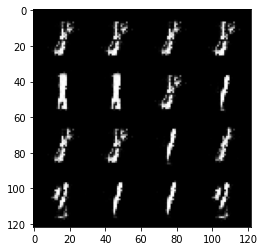

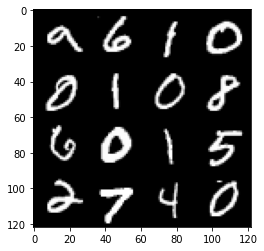

98: step 46200 / Gen loss: 3.50710035721461 / disc_loss: 0.1316746131330729


  0%|          | 0/469 [00:00<?, ?it/s]

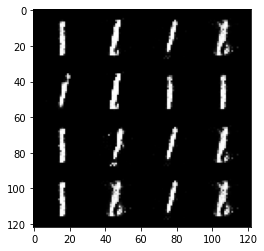

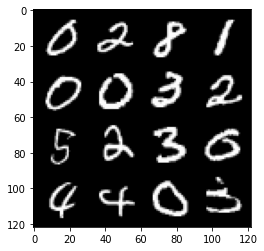

99: step 46500 / Gen loss: 3.5713392337163286 / disc_loss: 0.13490913613388936


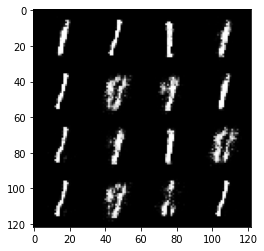

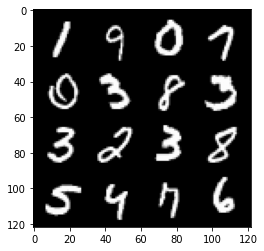

99: step 46800 / Gen loss: 3.496210622787475 / disc_loss: 0.11625885019078844


  0%|          | 0/469 [00:00<?, ?it/s]

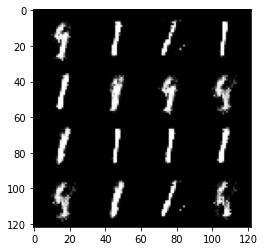

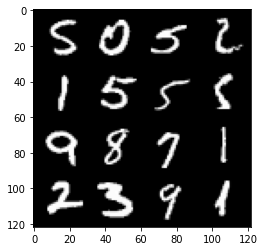

100: step 47100 / Gen loss: 3.8208091259002694 / disc_loss: 0.09779092616712053


  0%|          | 0/469 [00:00<?, ?it/s]

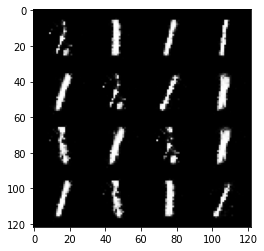

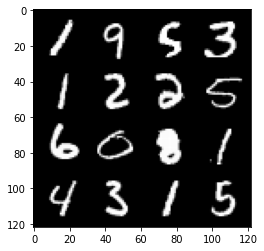

101: step 47400 / Gen loss: 3.634147638479869 / disc_loss: 0.1257695780818661


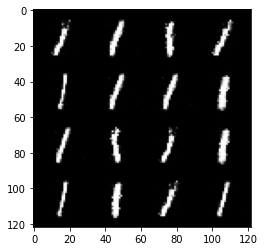

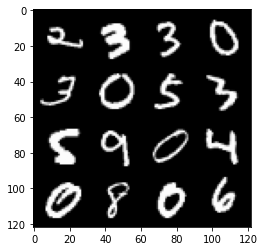

101: step 47700 / Gen loss: 3.3851674811045327 / disc_loss: 0.1368041266128421


  0%|          | 0/469 [00:00<?, ?it/s]

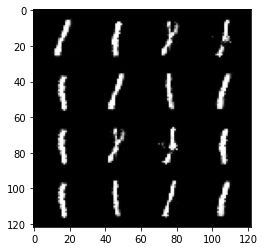

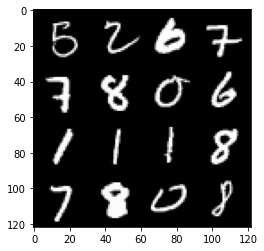

102: step 48000 / Gen loss: 3.4149175278345756 / disc_loss: 0.11958745645980043


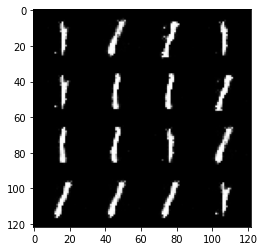

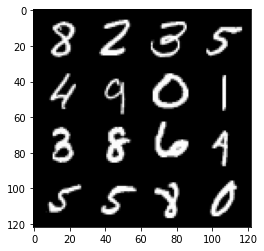

102: step 48300 / Gen loss: 3.3773443309466034 / disc_loss: 0.107524803193907


  0%|          | 0/469 [00:00<?, ?it/s]

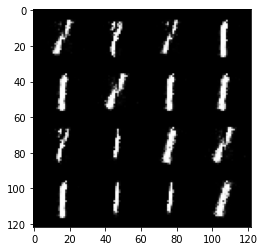

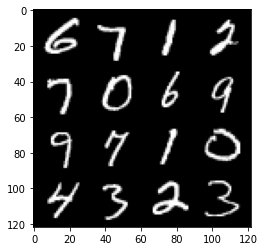

103: step 48600 / Gen loss: 3.520549033482868 / disc_loss: 0.11510151161501804


  0%|          | 0/469 [00:00<?, ?it/s]

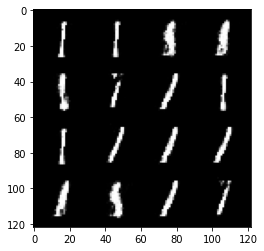

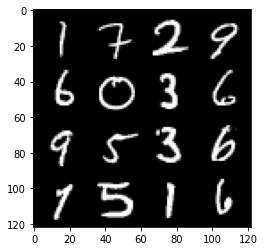

104: step 48900 / Gen loss: 3.3537507216135647 / disc_loss: 0.13510381155957787


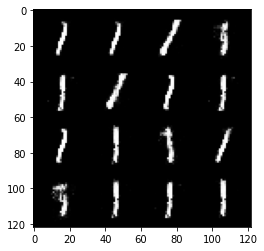

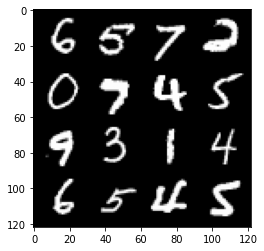

104: step 49200 / Gen loss: 3.551746189594269 / disc_loss: 0.12466087929904456


  0%|          | 0/469 [00:00<?, ?it/s]

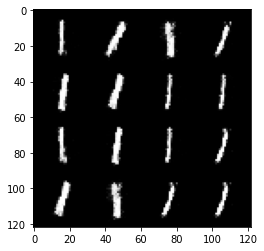

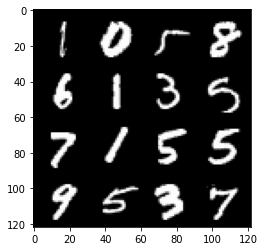

105: step 49500 / Gen loss: 3.1967093833287556 / disc_loss: 0.15446997569253063


  0%|          | 0/469 [00:00<?, ?it/s]

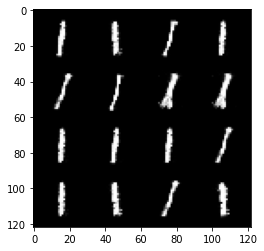

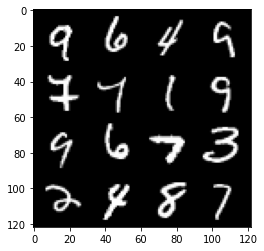

106: step 49800 / Gen loss: 3.246479732195536 / disc_loss: 0.13345310377577946


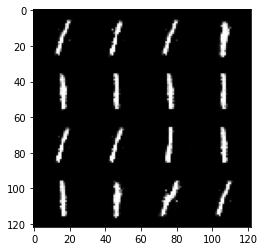

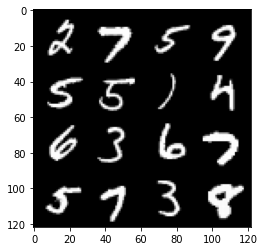

106: step 50100 / Gen loss: 3.258840498924255 / disc_loss: 0.13028228090455132


  0%|          | 0/469 [00:00<?, ?it/s]

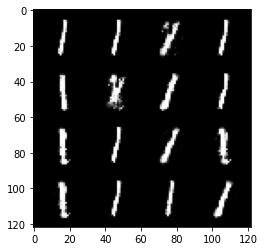

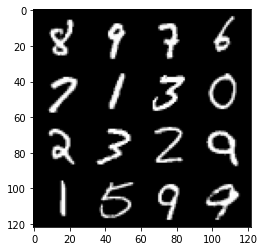

107: step 50400 / Gen loss: 3.343219898541769 / disc_loss: 0.1422671569759648


  0%|          | 0/469 [00:00<?, ?it/s]

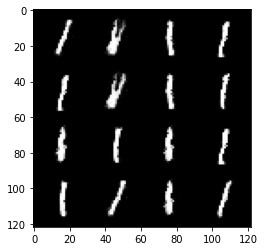

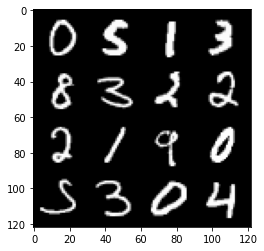

108: step 50700 / Gen loss: 3.2535879659652696 / disc_loss: 0.1305916012078524


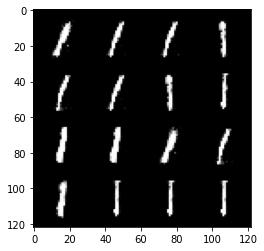

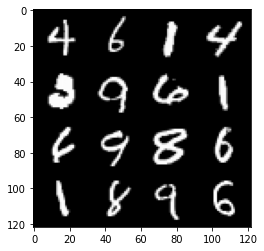

108: step 51000 / Gen loss: 3.2731919439633703 / disc_loss: 0.13785193587342895


  0%|          | 0/469 [00:00<?, ?it/s]

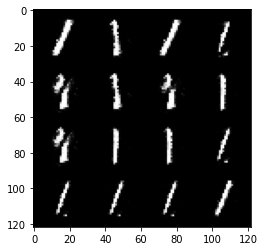

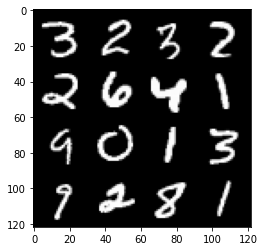

109: step 51300 / Gen loss: 3.4543368244171155 / disc_loss: 0.12292590682705237


  0%|          | 0/469 [00:00<?, ?it/s]

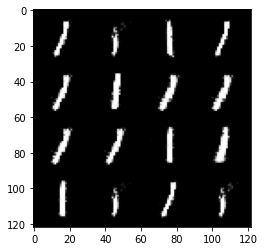

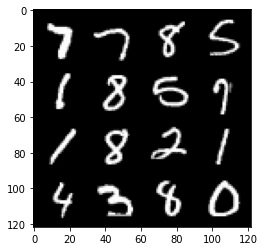

110: step 51600 / Gen loss: 3.375794927279156 / disc_loss: 0.11221493713557713


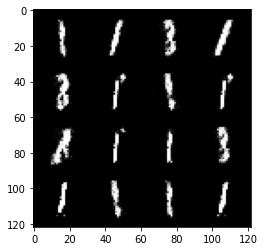

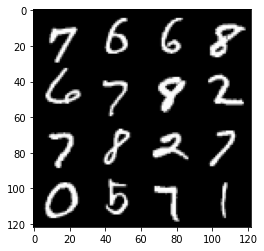

110: step 51900 / Gen loss: 3.341083729267118 / disc_loss: 0.13064567567159732


  0%|          | 0/469 [00:00<?, ?it/s]

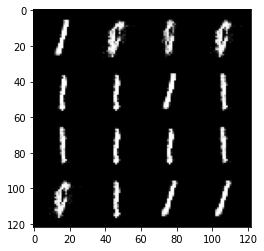

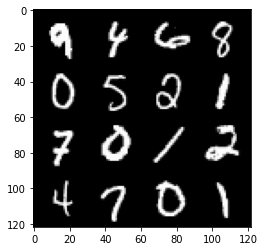

111: step 52200 / Gen loss: 3.385612817605337 / disc_loss: 0.12140448325624074


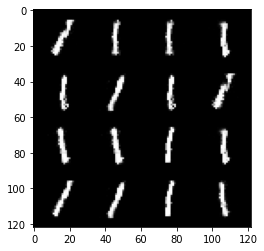

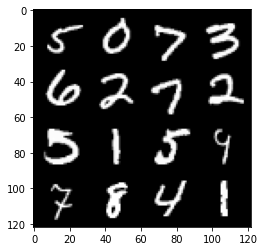

111: step 52500 / Gen loss: 3.465549154281615 / disc_loss: 0.12168044362217183


  0%|          | 0/469 [00:00<?, ?it/s]

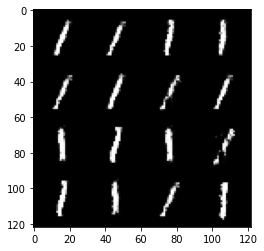

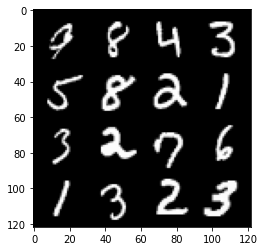

112: step 52800 / Gen loss: 3.157566355069478 / disc_loss: 0.13944424759596588


  0%|          | 0/469 [00:00<?, ?it/s]

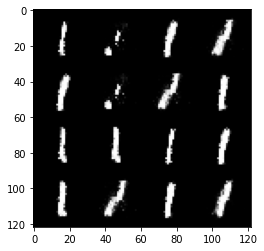

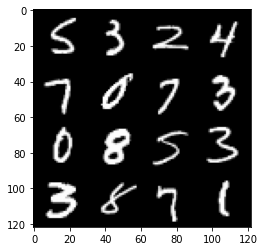

113: step 53100 / Gen loss: 3.2906330760320004 / disc_loss: 0.13678891626497106


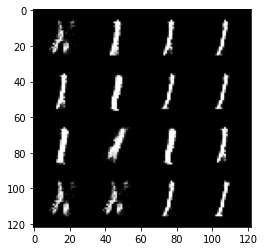

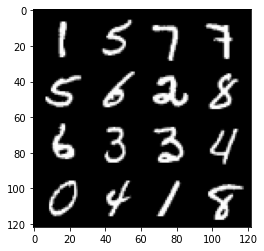

113: step 53400 / Gen loss: 3.518742526372273 / disc_loss: 0.11387115448713307


  0%|          | 0/469 [00:00<?, ?it/s]

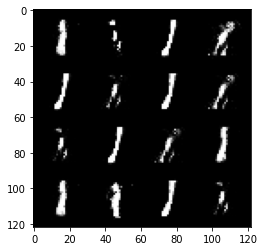

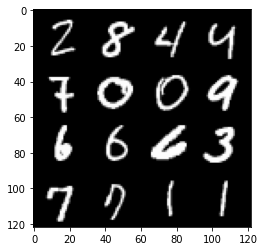

114: step 53700 / Gen loss: 3.749578979015354 / disc_loss: 0.09126430970306196


  0%|          | 0/469 [00:00<?, ?it/s]

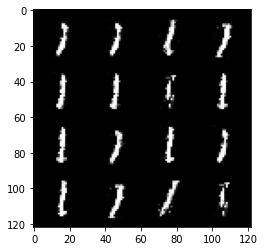

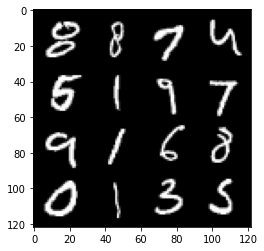

115: step 54000 / Gen loss: 3.582764914830525 / disc_loss: 0.08352260442450646


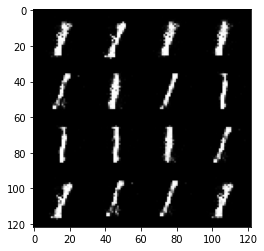

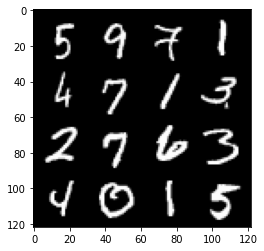

115: step 54300 / Gen loss: 3.5992533771197 / disc_loss: 0.09357362224409974


  0%|          | 0/469 [00:00<?, ?it/s]

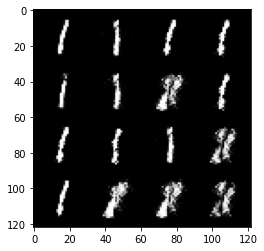

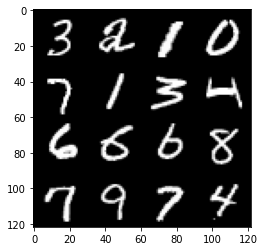

116: step 54600 / Gen loss: 3.3626219765345255 / disc_loss: 0.14583151041219625


  0%|          | 0/469 [00:00<?, ?it/s]

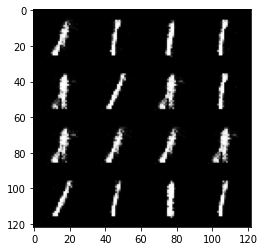

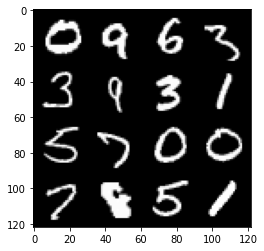

117: step 54900 / Gen loss: 3.220777180194857 / disc_loss: 0.11577776384850334


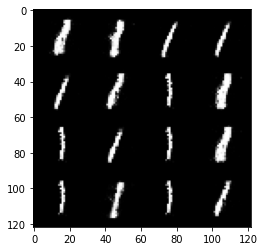

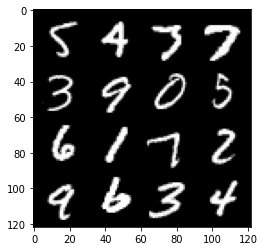

117: step 55200 / Gen loss: 3.20599421898524 / disc_loss: 0.12956375480939938


  0%|          | 0/469 [00:00<?, ?it/s]

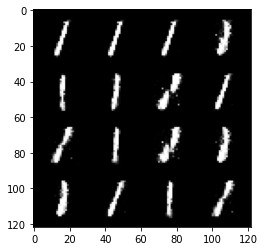

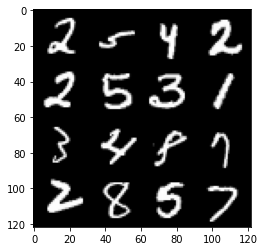

118: step 55500 / Gen loss: 3.3446637384096807 / disc_loss: 0.12894743485997115


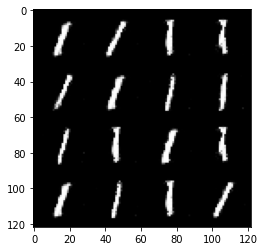

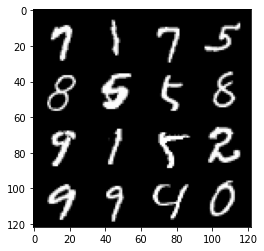

118: step 55800 / Gen loss: 3.090455457369487 / disc_loss: 0.1306034755458434


  0%|          | 0/469 [00:00<?, ?it/s]

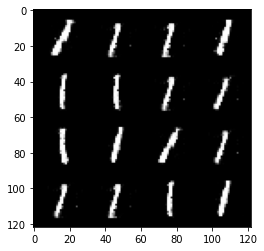

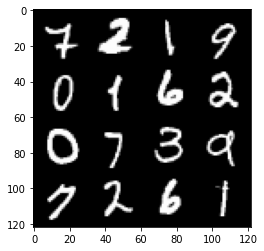

119: step 56100 / Gen loss: 3.1569822629292776 / disc_loss: 0.13539472767462316


  0%|          | 0/469 [00:00<?, ?it/s]

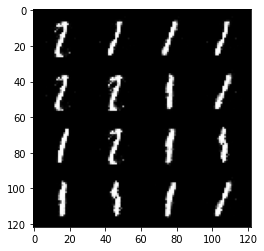

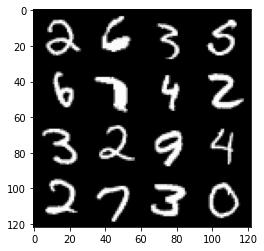

120: step 56400 / Gen loss: 3.2379204336802165 / disc_loss: 0.1055548067949713


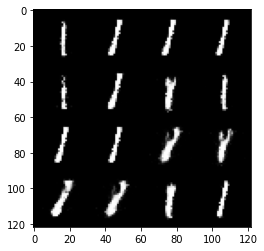

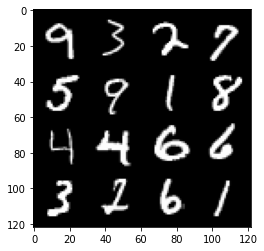

120: step 56700 / Gen loss: 3.446707982222238 / disc_loss: 0.10750831323365369


  0%|          | 0/469 [00:00<?, ?it/s]

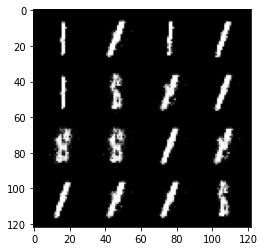

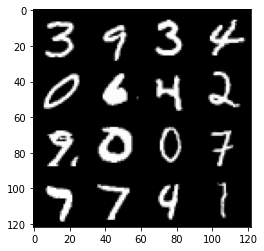

121: step 57000 / Gen loss: 3.2358552432060246 / disc_loss: 0.11245538956175245


  0%|          | 0/469 [00:00<?, ?it/s]

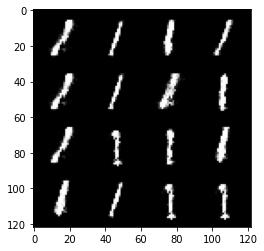

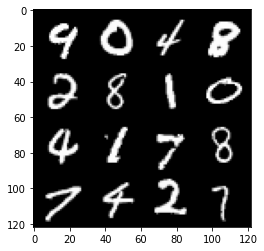

122: step 57300 / Gen loss: 3.3930239931742316 / disc_loss: 0.11780242924888921


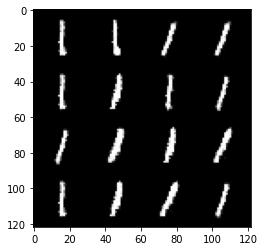

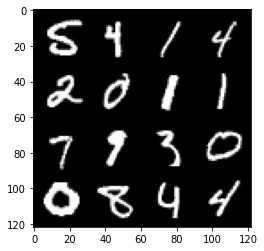

122: step 57600 / Gen loss: 3.285533560911817 / disc_loss: 0.12662338772167764


  0%|          | 0/469 [00:00<?, ?it/s]

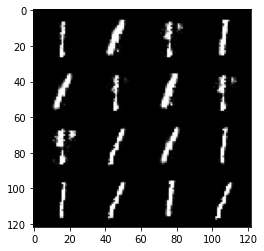

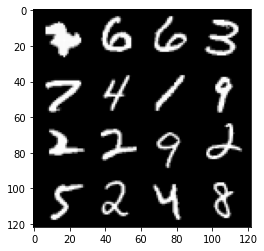

123: step 57900 / Gen loss: 3.1262361391385363 / disc_loss: 0.14568769365549097


  0%|          | 0/469 [00:00<?, ?it/s]

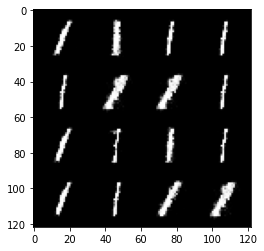

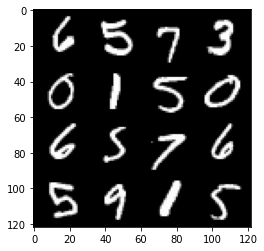

124: step 58200 / Gen loss: 3.2461290478706335 / disc_loss: 0.12249626544614622


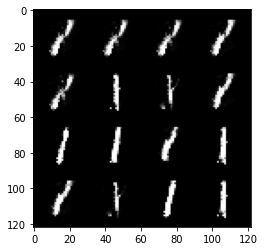

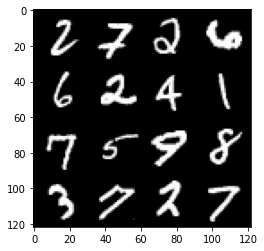

124: step 58500 / Gen loss: 3.045074679851532 / disc_loss: 0.1334232908735674


  0%|          | 0/469 [00:00<?, ?it/s]

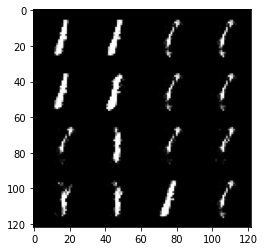

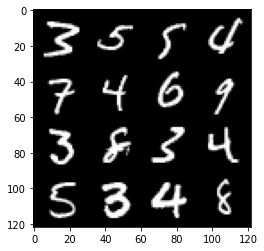

125: step 58800 / Gen loss: 3.4736281132698057 / disc_loss: 0.10769847185040508


  0%|          | 0/469 [00:00<?, ?it/s]

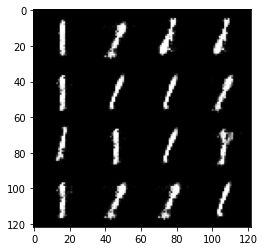

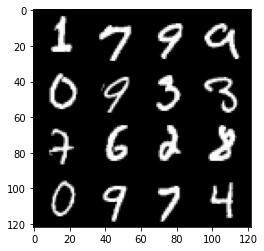

126: step 59100 / Gen loss: 3.423009307384492 / disc_loss: 0.09882096368819472


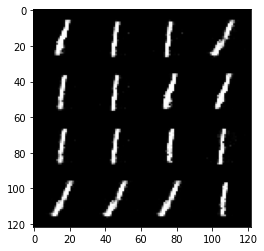

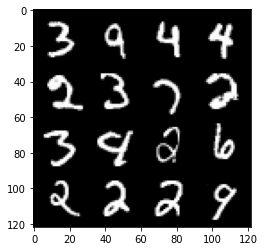

126: step 59400 / Gen loss: 3.339057482083637 / disc_loss: 0.13495912084976822


  0%|          | 0/469 [00:00<?, ?it/s]

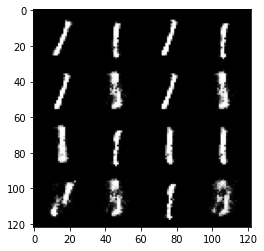

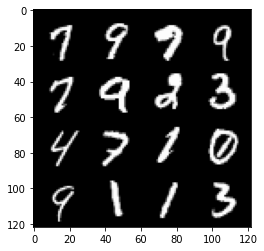

127: step 59700 / Gen loss: 3.1888757300376893 / disc_loss: 0.1314517290766041


In [ ]:
for epoch in range(epochs):
  for real,_ in tqdm(dataloader):   # b/c we dont need labels for real images
  ### D
    disc_opt.zero_grad()


    cur_bs = len(real)  # real : 128 x 1 x 28 x 28
    real = real.view(cur_bs,-1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)

    disc_loss.backward(retain_graph=True)

    disc_opt.step()


    ## G

    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()


    ##Visualise and stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1